Extract Variables from Files

In [ ]:
import os
import pandas as pd
import re

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

def extract_age(text):
    """Extracts age between 'CHI' and 'Target_Child' or any valid age pattern."""
    if not isinstance(text, str):
        return None

    match = re.search(r'CHI(?:.*?)(\d+;\d{2}(?:\.\d{2})?)(?:.*?Target_Child)', text)
    if match:
        return match.group(1)

    match = re.search(r'(\d+;\d{2}(?:\.\d{2})?)', text)
    return match.group(1) if match else None

data = []
file_id = 1  

for dirpath, _, filenames in os.walk(root_dir):
    for filename in filenames:
        if filename.endswith(".cha"):
            file_path = os.path.join(dirpath, filename)

            try:
                with open(file_path, "r", encoding="utf-8") as f:
                    content = f.read()
            except Exception as e:
                print(f"⚠️ Error reading {file_path}: {e}")
                continue

            age = extract_age(content)

            relative_path = os.path.relpath(file_path, root_dir)
            path_parts = relative_path.split(os.sep)
            language = path_parts[0] if len(path_parts) > 0 else None
            study = path_parts[1] if len(path_parts) > 1 else None

            data.append({
                "ID": file_id,
                "Filename": filename,
                "Age": age,
                "Language": language,
                "Study": study,
                "FullPath": file_path,
                "RelativePath": relative_path
            })
            file_id += 1  

df = pd.DataFrame(data)

df.to_excel(data_path, index=False)

print(f"✅ Saved extracted data with FullPath, RelativePath, and ID to: {data_path}")


✅ Saved extracted data with FullPath, RelativePath, and ID to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx


In [ ]:
import os
import pandas as pd
import re

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

if not os.path.exists(file_path):
    print(f"❌ File not found: {file_path}. Please generate it first.")
    exit()

df = pd.read_excel(file_path)

def find_specific_age_patterns(text):
    """Searches for age patterns in CHAT files."""
    if not isinstance(text, str):
        return None
    pattern = r'\b(?:\d{1,2};\d{1,2}\.\d{1}|\d{1,2};\d{1,2})\b'
    matches = re.findall(pattern, text)
    return matches[0] if matches else None

for index, row in df.iterrows():
    if pd.isna(row["Age"]):
        relative_path = row.get("RelativePath")

        if pd.isna(relative_path):
            print(f" Missing RelativePath for row {index}")
            continue

        full_path = os.path.join(root_dir, relative_path)

        if os.path.exists(full_path):
            try:
                with open(full_path, "r", encoding="utf-8") as f:
                    content = f.read()

                possible_age = find_specific_age_patterns(content)

                if possible_age:
                    print(f" Found age {possible_age} in {relative_path}, updating dataset.")
                    df.at[index, "Age"] = possible_age
                else:
                    print(f" No age pattern found in {relative_path}")

            except Exception as e:
                print(f" Error reading {relative_path}: {e}")
        else:
            print(f" File not found: {relative_path}")

df.to_excel(file_path, index=False)

print(f" Updated dataset saved at: {file_path}")


❌ No age pattern found in English North America\Barriere\Barriere\ph46.cha
❌ No age pattern found in English North America\Cameron\Cameron\AAE\B5_37_59_PE_O22.cha
❌ No age pattern found in English North America\DSLT\DSLT\ACR-ac.cha
❌ No age pattern found in English North America\DSLT\DSLT\ACR-nar.cha
❌ No age pattern found in English North America\DSLT\DSLT\ACR-pp.cha
❌ No age pattern found in English North America\DSLT\DSLT\AMM-ac.cha
❌ No age pattern found in English North America\DSLT\DSLT\AMM-nar.cha
❌ No age pattern found in English North America\DSLT\DSLT\AMM-pp.cha
❌ No age pattern found in English North America\DSLT\DSLT\AMR-ac.cha
❌ No age pattern found in English North America\DSLT\DSLT\AMR-nar.cha
❌ No age pattern found in English North America\DSLT\DSLT\AMR-pp.cha
❌ No age pattern found in English North America\DSLT\DSLT\ASD-ac.cha
❌ No age pattern found in English North America\DSLT\DSLT\ASD-nar.cha
❌ No age pattern found in English North America\DSLT\DSLT\ASD-pp.cha
❌ No 

In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

df = pd.read_excel(file_path)

total_rows = len(df)

rows_with_age = df["Age"].notna().sum()
rows_without_age = df["Age"].isna().sum()

percent_with_age = (rows_with_age / total_rows) * 100
percent_without_age = (rows_without_age / total_rows) * 100

print(f" Rows with age: {rows_with_age} ({percent_with_age:.2f}%)")
print(f" Rows without age: {rows_without_age} ({percent_without_age:.2f}%)")


✅ Rows with age: 11097 (83.56%)
❌ Rows without age: 2183 (16.44%)


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

df = pd.read_excel(file_path)

df = df.dropna(subset=["Age"])

df.to_excel(file_path, index=False)

print(f" Rows with missing Age values have been removed. Cleaned file saved at: {file_path}")


✅ Rows with missing Age values have been removed. Cleaned file saved at: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx


In [ ]:
import os
import pandas as pd
import re

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

pattern = re.compile(r'\b\d{1,2};\d{1,2}(?:\.(?:\d{1,2})?)?\b')

def normalize_age(age_str):
    try:
        parts = age_str.strip().split(";")
        year = int(parts[0])
        if "." in parts[1]:
            month, dec = parts[1].split(".")
            return (year, int(month), int(dec) if dec else 0)
        else:
            return (year, int(parts[1]), 0)
    except:
        return None

results = []
seen_paths = set()
printed_duplicate = False

for dirpath, _, filenames in os.walk(root_dir):
    for filename in filenames:
        if filename.endswith(".cha"):
            file_path = os.path.join(dirpath, filename)
            relative_path = os.path.relpath(file_path, root_dir)

            if relative_path in seen_paths:
                if not printed_duplicate:
                    print(f"\n First duplicate RelativePath encountered: {relative_path}")
                    printed_duplicate = True
                continue
            seen_paths.add(relative_path)

            try:
                with open(file_path, "r", encoding="utf-8") as f:
                    content = f.read()

                all_matches = [m.strip() for m in pattern.findall(content)]

                normalized_pairs = []
                seen_norms = set()
                for m in all_matches:
                    norm = normalize_age(m)
                    if norm and norm not in seen_norms:
                        normalized_pairs.append((m, norm))
                        seen_norms.add(norm)

                unique_normalized = seen_norms

                if len(unique_normalized) > 1:
                    print(f"\n {relative_path} has {len(unique_normalized)} DIFFERENT age patterns:")
                    lines_to_print = set()
                    for match in set(all_matches):
                        for line in content.splitlines():
                            if match in line:
                                lines_to_print.add(line.strip())
                                break
                    for line in lines_to_print:
                        print(f"    → {line}")

                results.append({
                    "RelativePath": relative_path,
                    "Num_Unique_Age_Patterns": len(unique_normalized),
                    "First_Match": all_matches[0] if all_matches else None
                })

            except Exception as e:
                print(f" Error reading {relative_path}: {e}")
                results.append({
                    "RelativePath": relative_path,
                    "Num_Unique_Age_Patterns": "Error",
                    "First_Match": str(e)
                })

df_filtered = pd.read_excel(data_path)

if "RelativePath" not in df_filtered.columns:
    print("'RelativePath' column not found in filtered file. Please add it before merging.")
else:
    df_counts = pd.DataFrame(results)[["RelativePath", "Num_Unique_Age_Patterns"]]
    df_filtered = pd.merge(df_filtered, df_counts, on="RelativePath", how="left")

    df_filtered.to_excel(data_path, index=False)
    print(f"\n Updated filtered file with 'Num_Unique_Age_Patterns': {data_path}")



⚠️ English North America\DELV\DELV\01JLA.cha has 2 DIFFERENT age patterns:
    → @ID:	eng|DELV|CHI|6;04.|male|nmaewh||Target_Child||12;0.|

⚠️ English North America\DELV\DELV\03NSH.cha has 2 DIFFERENT age patterns:
    → @ID:	eng|DELV|CHI|5;06.|male|dmaewh||Target_Child||14;0.|

⚠️ English North America\DELV\DELV\04JNA.cha has 2 DIFFERENT age patterns:
    → @ID:	eng|DELV|CHI|6;09.|male|daaewh||Target_Child||12;0.|

⚠️ English North America\DELV\DELV\05CST.cha has 2 DIFFERENT age patterns:
    → @ID:	eng|DELV|CHI|6;07.|male|naaewh||Target_Child||12;0.|

⚠️ English North America\DELV\DELV\06NSO.cha has 2 DIFFERENT age patterns:
    → @ID:	eng|DELV|CHI|6;07.|male|daaewh||Target_Child||14;0.|

⚠️ English North America\DELV\DELV\07TFO.cha has 2 DIFFERENT age patterns:
    → @ID:	eng|DELV|CHI|5;01.|male|aae-td||Target_Child||12;0.|

⚠️ English North America\DELV\DELV\08JYO.cha has 2 DIFFERENT age patterns:
    → @ID:	eng|DELV|CHI|5;07.|male|00000||Target_Child||0;0.|

⚠️ English North Amer

In [ ]:
import pandas as pd

data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

df = pd.read_excel(data_path)

original_count = len(df)

df = df[df["Num_Unique_Age_Patterns"] <= 1]

dropped_count = original_count - len(df)

df.to_excel(data_path, index=False)

print(f" Removed {dropped_count} rows with multiple age patterns.")
print(f" Cleaned file saved at: {data_path}")


✅ Removed 470 rows with multiple age patterns.
✅ Cleaned file saved at: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx


In [ ]:
import pandas as pd
import re

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

df = pd.read_excel(file_path)

def generalize_pattern(age_value):
    if pd.isna(age_value):
        return None
    return re.sub(r"\d", "#", str(age_value))

df['Generalized_Pattern'] = df['Age'].apply(generalize_pattern)

pattern_counts = df['Generalized_Pattern'].value_counts()
print(" Generalized age format patterns and their counts:")
print(pattern_counts)

def standardize_age_format(row):
    age = row['Age']
    pattern = row['Generalized_Pattern']
    if pd.isna(age):
        return age  
    if pattern == "#;##.##":
        return f"0{age}"
    elif pattern == "#;##":
        return f"0{age}.00"
    elif pattern == "##;##":
        return f"{age}.00"
    return age 

df['Standardized_Age'] = df.apply(standardize_age_format, axis=1)

df.to_excel(file_path, index=False)

print("\nPreview of standardized ages:")
print(df[['Age', 'Generalized_Pattern', 'Standardized_Age']].head())


🧾 Generalized age format patterns and their counts:
Generalized_Pattern
#;##.##     6408
#;##        2897
##;##.##     982
##;##        340
Name: count, dtype: int64

✅ Preview of standardized ages:
       Age Generalized_Pattern Standardized_Age
0  4;09.27             #;##.##         04;09.27
1  3;05.17             #;##.##         03;05.17
2  4;01.27             #;##.##         04;01.27
3  4;11.26             #;##.##         04;11.26
4  4;07.19             #;##.##         04;07.19


In [ ]:
import pandas as pd
import re

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

df = pd.read_excel(file_path)

def age_to_days(age):
    if pd.isna(age):
        return None  

    match = re.match(r'(\d{1,2});(\d{1,2})\.(\d{1,2})', str(age))
    if match:
        years, months, days = map(int, match.groups())
        return years * 365 + months * 30 + days

    return None 

df['Age_in_Days'] = df['Standardized_Age'].apply(age_to_days)

df.to_excel(file_path, index=False)

print(df[['Standardized_Age', 'Age_in_Days']].head())


  Standardized_Age  Age_in_Days
0         04;09.27         1757
1         03;05.17         1262
2         04;01.27         1517
3         04;11.26         1816
4         04;07.19         1689


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"
df = pd.read_excel(file_path)

num_dropped = (df["Age_in_Days"] > 2191.5).sum()
print(f" Number of rows to be dropped (Age_in_Days > 2191.5): {num_dropped}")

df = df[df["Age_in_Days"] <= 2191.5]

df.to_excel(file_path, index=False)
print("Dataset saved with only children age ≤ 2191.5 days.")


🧹 Number of rows to be dropped (Age_in_Days > 2191.5): 1726
✅ Dataset saved with only children age ≤ 2191.5 days.


In [26]:
print(df['Age_in_Days'].describe())


count    8901.000000
mean     1015.651725
std       474.546593
min         0.000000
25%       730.000000
50%       940.000000
75%      1275.000000
max      2190.000000
Name: Age_in_Days, dtype: float64


In [ ]:
import os
import re
import pandas as pd

data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"

df = pd.read_excel(data_path)

def check_speaker_presence(text, code):
    return bool(re.search(rf"^\*{code}:", text, flags=re.MULTILINE))

mot_presence = {}
chi_presence = {}

for i, row in df.iterrows():
    relative_path = row.get("RelativePath")
    if pd.isna(relative_path):
        mot_presence[relative_path] = False
        chi_presence[relative_path] = False
        continue

    full_path = os.path.join(root_dir, relative_path)
    if not os.path.exists(full_path):
        print(f" File not found: {relative_path}")
        mot_presence[relative_path] = False
        chi_presence[relative_path] = False
        continue

    try:
        with open(full_path, "r", encoding="utf-8") as f:
            content = f.read()
        mot_presence[relative_path] = check_speaker_presence(content, "MOT")
        chi_presence[relative_path] = check_speaker_presence(content, "CHI")
    except Exception as e:
        print(f"Error reading {relative_path}: {e}")
        mot_presence[relative_path] = False
        chi_presence[relative_path] = False

df["MOT_Present"] = df["RelativePath"].map(mot_presence)
df["CHI_Present"] = df["RelativePath"].map(chi_presence)

df.to_excel(data_path, index=False)
print("Speaker presence (MOT/CHI) added to:", data_path)


✅ Speaker presence (MOT/CHI) added to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

df = pd.read_excel(file_path)

initial_count = len(df)
df = df[(df["MOT_Present"] == True) & (df["CHI_Present"] == True)]
dropped_count = initial_count - len(df)

df.to_excel(file_path, index=False)

print(f" Dropped {dropped_count} rows where MOT or CHI was not present.")
print(f" Cleaned file saved at: {file_path}")


✅ Dropped 1636 rows where MOT or CHI was not present.
✅ Cleaned file saved at: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx


In [ ]:
import pandas as pd
import os
import re



file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"
df = pd.read_excel(file_path)


id_lookup = {}
next_id = 1
numeric_ids = []

for _, row in df.iterrows():
    lang = row["Language"]
    study = row["Study"]
    rel_path = row["RelativePath"]
    filename = row["Filename"]
    file_stem = os.path.splitext(filename)[0]
    path_parts = rel_path.split(os.sep)

    key = None


    if (lang == "English UK" and study in ["Belfast", "MPI-EVA-Manchester", "Manchester (3)", "Wells"]) or \
       (lang == "English USA" and study in [
           "Bernstein", "Bloom", "Bohannon", "Brent", "Brown", "Higginson", "McCune",
           "Post", "Soderstrom", "Weist"
       ]):
        key = (lang, study, path_parts[-2])

    elif (lang == "English UK" and study in ["Forrester", "Lara", "Thomas"]) or \
         (lang == "English USA" and study in [
             "Braunwald", "Clark", "Feldman", "Kuczaj", "MacWhinney",
             "Peters", "Sachs", "Snow", "Suppes", "Nelson"
         ]):
        key = (lang, study, "single_child")

    elif (lang == "English USA" and study in [
        "EllisWeismer", "Bliss", "Gleason", "NewEngland", "NewmanRatner"
    ]):
        key = (lang, study, filename)

    elif lang == "English USA" and study == "Gelman":
        if "2014-IndDiff" in rel_path:
            match = re.match(r"^(\d{2})", file_stem)
            prefix = match.group(1) if match else file_stem 
            key = (lang, study, "2014-IndDiff", prefix)
        else:
            key = (lang, study, rel_path)


    elif (lang == "English USA" and study in [
        "Hall", "McMillan", "Morisset", "Nadig", "OCSC", "Tardif", "Warren"
    ]):
        key = (lang, study, rel_path)


    elif lang == "English USA" and study == "Champaign":
        key = (lang, study, file_stem)


    elif lang == "English USA" and study == "Demetras2":
        if len(path_parts) >= 3:
            key = (lang, study, path_parts[-3])

    elif (lang == "English UK" and study in ["Edinburgh", "Howe", "Tommerdahl"]):
        match = re.match(r"([^\d]+)", file_stem)
        key = (lang, study, match.group(1) if match else file_stem)

    elif lang == "English USA" and study == "Bates":
        subfolder = path_parts[-2] if len(path_parts) >= 2 else ""
        name = file_stem
        if subfolder == "Free28":
            name = re.sub(r"28$", "", name)
        elif subfolder == "Story28":
            name = re.sub(r"st$", "", name)
        key = (lang, study, name)

    elif lang == "English USA" and study == "HSLLD":
        key = (lang, study, file_stem[:3].lower())

    elif lang == "English USA" and study == "TD":
        key = (lang, study, re.sub(r"\d$", "", file_stem))

    elif lang == "English USA" and study in ["Valian", "VanHouten"]:
        key = (lang, study, file_stem[:-1])




    if key is None:
        numeric_ids.append(None)
        continue


    if key not in id_lookup:
        id_lookup[key] = next_id
        next_id += 1

    numeric_ids.append(id_lookup[key])

df["NumericID"] = numeric_ids

df.to_excel(file_path, index=False)
print("NumericID assigned based on per-study rules.")

num_missing_ids = df["NumericID"].isna().sum()
print(f" {num_missing_ids} row(s) do not have a NumericID assigned.")

if num_missing_ids > 0:
    print("\n Rows without a NumericID:")
    print(df[df["NumericID"].isna()][["Filename", "Study", "Language", "RelativePath"]])


✅ NumericID assigned based on per-study rules.
🔍 0 row(s) do not have a NumericID assigned.


In [30]:
print(df["NumericID"].value_counts())


NumericID
187    815
88     377
87     204
86     178
669    156
      ... 
752      1
753      1
754      1
755      1
709      1
Name: count, Length: 1310, dtype: int64


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"
df = pd.read_excel(file_path)

age_dupes = df.groupby(['NumericID', 'Age_in_Days']).size().reset_index(name='Count')

age_dupes = age_dupes[age_dupes['Count'] > 1]

df['DuplicateAgeFlag'] = df.merge(
    age_dupes[['NumericID', 'Age_in_Days']],
    on=['NumericID', 'Age_in_Days'],
    how='left',
    indicator=True
)['_merge'] == 'both'

df['DuplicateAgeFlag'] = df['DuplicateAgeFlag'].astype(int)

num_flagged = df['DuplicateAgeFlag'].sum()
print(f" Number of files flagged for duplicate age per child (NumericID): {num_flagged}")

num_children_flagged = df.loc[df['DuplicateAgeFlag'] == 1, 'NumericID'].nunique()
print(f" Number of unique children with duplicate ages: {num_children_flagged}")


🔎 Number of files flagged for duplicate age per child (NumericID): 2816
👶 Number of unique children with duplicate ages: 360


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"
df = pd.read_excel(file_path)

age_dupes = df.groupby(['NumericID', 'Age_in_Days']).size().reset_index(name='Count')
age_dupes = age_dupes[age_dupes['Count'] > 1]

df['DuplicateAgeFlag'] = df.merge(
    age_dupes[['NumericID', 'Age_in_Days']],
    on=['NumericID', 'Age_in_Days'],
    how='left',
    indicator=True
)['_merge'] == 'both'

df['DuplicateAgeFlag'] = df['DuplicateAgeFlag'].astype(int)

dupes = df[df['DuplicateAgeFlag'] == 1]
non_dupes = df[df['DuplicateAgeFlag'] == 0]

collapsed = (
    dupes.groupby(['NumericID', 'Age_in_Days']).agg({
        'ID': list,
        'Filename': list,
        'FullPath': list,
        'RelativePath': list,
        'Language': 'first',
        'Study': 'first',
        'Num_Unique_Age_Patterns': 'first',
        'Generalized_Pattern': 'first',
        'Standardized_Age': 'first',
        'MOT_Present': 'first',
        'CHI_Present': 'first',
    }).reset_index()
)

df_updated = pd.concat([non_dupes, collapsed], ignore_index=True)
df_updated.drop(columns='DuplicateAgeFlag', inplace=True)


def normalize_paths(entry):
    def fix(p):
        return p.replace("/", "\\").replace("\\\\", "\\")

    if isinstance(entry, list):
        return [fix(p) for p in entry]
    elif isinstance(entry, str):
        return fix(entry)
    return entry

df_updated["RelativePath"] = df_updated["RelativePath"].apply(normalize_paths)


df_updated.to_excel(file_path, index=False)
print("File updated with rows collapsed by (NumericID, Age_in_Days) and paths cleaned.")


✅ File updated with rows collapsed by (NumericID, Age_in_Days) and paths cleaned.


In [ ]:
import os
import pandas as pd
import re
import ast
from collections import defaultdict

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"

df = pd.read_excel(data_path)

def parse_lists(val):
    if isinstance(val, str) and val.startswith("[") and val.endswith("]"):
        try:
            parsed = ast.literal_eval(val)
            if isinstance(parsed, list):
                return parsed
        except:
            pass
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

def normalize(path):
    return os.path.normpath(path)

def extract_turn_counts(text):
    """Extracts turn counts only for CHI and MOT speakers, splitting utterances by punctuation."""
    if not isinstance(text, str):
        return {}, 0

    speaker_lines = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)
    counts = defaultdict(int)
    total_turns = 0

    for speaker, utterance in speaker_lines:
        clean_speaker = speaker.lstrip("*")

        segments = re.split(r"[.?!]+", utterance)
        for segment in segments:
            if segment.strip():
                counts[clean_speaker] += 1
                total_turns += 1

    return counts, total_turns



file_speaker_counts = {}
file_total_turns = {}
all_speaker_codes = set()

for dirpath, _, filenames in os.walk(root_dir):
    for filename in filenames:
        if filename.endswith(".cha"):
            file_path = os.path.join(dirpath, filename)
            relative_path = os.path.relpath(file_path, root_dir)
            normalized_path = normalize(relative_path)

            try:
                with open(file_path, "r", encoding="utf-8") as f:
                    content = f.read()

                counts, total_turns = extract_turn_counts(content)
                file_speaker_counts[normalized_path] = counts
                file_total_turns[normalized_path] = total_turns
                all_speaker_codes.update(counts.keys())

            except Exception as e:
                print(f" Error reading {relative_path}: {e}")

for speaker_code in sorted(all_speaker_codes):
    col_name = f"{speaker_code}_Turns"

    def speaker_turn_sum(paths):
        if isinstance(paths, list):
            return sum(file_speaker_counts.get(normalize(p), {}).get(speaker_code, 0) for p in paths)
        else:
            return file_speaker_counts.get(normalize(paths), {}).get(speaker_code, 0)

    df[col_name] = df["RelativePath"].map(speaker_turn_sum).astype(int)

def total_turns_sum(paths):
    if isinstance(paths, list):
        return sum(file_total_turns.get(normalize(p), 0) for p in paths)
    else:
        return file_total_turns.get(normalize(paths), 0)

df["Total_Turns"] = df["RelativePath"].map(total_turns_sum).astype(int)

df.to_excel(data_path, index=False)
print(f" Speaker turn counts and total turns added and saved to: {data_path}")


C:\Users\isa97\AppData\Local\Temp\ipykernel_14016\2308904147.py:78: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = df["RelativePath"].map(speaker_turn_sum).astype(int)
C:\Users\isa97\AppData\Local\Temp\ipykernel_14016\2308904147.py:78: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = df["RelativePath"].map(speaker_turn_sum).astype(int)
C:\Users\isa97\AppData\Local\Temp\ipykernel_14016\2308904147.py:78: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.inse

✅ Speaker turn counts and total turns added and saved to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data.xlsx"
df = pd.read_excel(file_path)

speaker_cols_to_drop = [
    col for col in df.columns
    if (
        col.endswith("_Turns") and
        not (col.startswith("MOT_") or col.startswith("CHI_") or col == "Total_Turns")
    )
]

df_filtered = df.drop(columns=speaker_cols_to_drop)

filtered_path = file_path.replace("childes_data.xlsx", "childes_data_filtered.xlsx")
df_filtered.to_excel(filtered_path, index=False)

print(f" Saved filtered dataset with only MOT/CHI _Turns and Total_Turns columns to: {filtered_path}")


✅ Saved filtered dataset with only MOT/CHI _Turns and Total_Turns columns to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx


In [ ]:
import os
import pandas as pd
import ast

excel_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"

df = pd.read_excel(excel_path)

def parse_lists(val):
    if isinstance(val, str) and val.startswith("[") and val.endswith("]"):
        try:
            parsed = ast.literal_eval(val)
            if isinstance(parsed, list):
                return parsed
        except:
            pass
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

all_paths = set()
for val in df["RelativePath"]:
    if isinstance(val, list):
        all_paths.update(val)
    elif isinstance(val, str):
        all_paths.add(val)

all_paths = [os.path.normpath(p) for p in all_paths]

files_with_child_tag = []
files_without_child_tag = []

for relative_path in all_paths:
    file_path = os.path.join(root_dir, relative_path)

    try:
        with open(file_path, "r", encoding="utf-8") as f:
            lines = f.readlines()

        norm_rel = os.path.normpath(relative_path)

        if "English USA" in norm_rel and "Nadig" in norm_rel:
            keywords = ["Child"]
        elif "English UK" in norm_rel and "Edinburgh" in norm_rel:
            keywords = ["Target_Child", "Child"]
        else:
            keywords = ["Target_Child"]

        if any(any(kw in line for kw in keywords) for line in lines):
            files_with_child_tag.append(relative_path)
        else:
            files_without_child_tag.append(relative_path)

    except Exception as e:
        print(f" Error reading {relative_path}: {e}")

print(f"\n Total files checked: {len(all_paths)}")
print(f"Files with required child tag: {len(files_with_child_tag)}")
print(f"Files without required child tag: {len(files_without_child_tag)}")

if files_without_child_tag:
    print("\n These files do NOT contain the required child tag:")
    for f in files_without_child_tag:
        print(f)



✅ Total files checked: 7265
✅ Files with required child tag: 7265
❌ Files without required child tag: 0


In [ ]:
import os
import pandas as pd
import ast
import re

excel_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"

df = pd.read_excel(excel_path)

def parse_lists(val):
    if isinstance(val, str) and val.startswith("[") and val.endswith("]"):
        try:
            parsed = ast.literal_eval(val)
            if isinstance(parsed, list):
                return parsed
        except:
            pass
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

def normalize_paths(val):
    if isinstance(val, list):
        return [os.path.normpath(v) for v in val]
    elif isinstance(val, str):
        return os.path.normpath(val)
    return val

df["RelativePath"] = df["RelativePath"].apply(normalize_paths)

def extract_gender_from_file(rel_path):
    path = os.path.join(root_dir, rel_path)
    try:
        with open(path, "r", encoding="utf-8") as f:
            lines = f.readlines()

        if "English USA" in rel_path and "Nadig" in rel_path:
            keywords = ["Child"]
        elif "English UK" in rel_path and "Edinburgh" in rel_path:
            keywords = ["Target_Child", "Child"]
        else:
            keywords = ["Target_Child"]

        for line in lines:
            if any(kw in line for kw in keywords):
                gender_match = re.search(r'\b(male|female)\b', line, flags=re.IGNORECASE)
                if gender_match:
                    return gender_match.group(1).lower()
        return None
    except Exception as e:
        print(f" Error reading {rel_path}: {e}")
        return None

grouped = df.groupby("NumericID")

for numeric_id, group in grouped:
    all_paths = []
    for val in group["RelativePath"]:
        if isinstance(val, list):
            all_paths.extend(val)
        elif isinstance(val, str):
            all_paths.append(val)

    genders = [(p, extract_gender_from_file(p)) for p in all_paths if p is not None]
    gender_values = [g for _, g in genders if g is not None]
    unique_genders = set(gender_values)

    if len(gender_values) == 0:
        print(f" No gender found in any file for NumericID {numeric_id}")
        for path in all_paths:
            print(f"   - {path}")
    elif len(unique_genders) > 1:
        print(f" INCONSISTENT genders found for NumericID {numeric_id}:")
        for file, g in genders:
            print(f"   - {file}: {g if g else '[No gender found]'}")


⚠️ INCONSISTENT genders found for NumericID 29:
   - English UK\Edinburgh\Edinburgh\hakeem0903.cha: female
   - English UK\Edinburgh\Edinburgh\hakeem0901.cha: female
   - English UK\Edinburgh\Edinburgh\hakeem0904.cha: male
   - English UK\Edinburgh\Edinburgh\hakeem1501.cha: male
   - English UK\Edinburgh\Edinburgh\hakeem1503.cha: male
⚠️ INCONSISTENT genders found for NumericID 88:
   - English UK\Thomas\Thomas\020012.cha: male
   - English UK\Thomas\Thomas\020013.cha: male
   - English UK\Thomas\Thomas\020016.cha: male
   - English UK\Thomas\Thomas\020018.cha: male
   - English UK\Thomas\Thomas\020019.cha: male
   - English UK\Thomas\Thomas\020020.cha: male
   - English UK\Thomas\Thomas\020023.cha: male
   - English UK\Thomas\Thomas\020024.cha: male
   - English UK\Thomas\Thomas\020025.cha: male
   - English UK\Thomas\Thomas\020026.cha: male
   - English UK\Thomas\Thomas\020027.cha: male
   - English UK\Thomas\Thomas\020100.cha: male
   - English UK\Thomas\Thomas\020103.cha: male
   -

In [ ]:
import os
import pandas as pd
import ast
import re

excel_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"

df = pd.read_excel(excel_path)

def parse_lists(val):
    if isinstance(val, str) and val.startswith("[") and val.endswith("]"):
        try:
            parsed = ast.literal_eval(val)
            if isinstance(parsed, list):
                return parsed
        except:
            pass
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

def normalize_paths(val):
    if isinstance(val, list):
        return [os.path.normpath(v) for v in val]
    elif isinstance(val, str):
        return os.path.normpath(val)
    return val

df["RelativePath"] = df["RelativePath"].apply(normalize_paths)

def extract_gender_from_file(rel_path):
    path = os.path.join(root_dir, rel_path)
    try:
        with open(path, "r", encoding="utf-8") as f:
            lines = f.readlines()
            if "English USA" in rel_path and "Nadig" in rel_path:
                keywords = ["Child"]
            elif "English UK" in rel_path and "Edinburgh" in rel_path:
                keywords = ["Target_Child", "Child"]
            else:
                keywords = ["Target_Child"]
            for line in lines:
                if any(kw in line for kw in keywords):
                    gender_match = re.search(r'\b(male|female)\b', line, flags=re.IGNORECASE)
                    if gender_match:
                        return gender_match.group(1).lower()
    except Exception as e:
        print(f" Error reading {rel_path}: {e}")
    return None

manual_overrides = {
    29: "female",
    88: "male",
    190: "male",
    224: "male",
    283: "male",
    612: "female",
    615: "female",
    623: "female",
    639: "male",
    683: "male",
    688: "male",
    1377: "male",
}

gender_assignments = {}
grouped = df.groupby("NumericID")

print("\n Gender inconsistencies or missing info:")

for numeric_id, group in grouped:
    all_paths = []
    for val in group["RelativePath"]:
        if isinstance(val, list):
            all_paths.extend(val)
        elif isinstance(val, str):
            all_paths.append(val)

    genders = [(p, extract_gender_from_file(p)) for p in all_paths if p is not None]
    gender_values = [g for _, g in genders if g is not None]
    unique_genders = set(gender_values)

    if numeric_id in manual_overrides:
        gender_assignments[numeric_id] = manual_overrides[numeric_id]
        print(f" Manual override for NumericID {numeric_id}: {manual_overrides[numeric_id]}")
    elif len(gender_values) == 0:
        gender_assignments[numeric_id] = None
        print(f" No gender found in any file for NumericID {numeric_id}")
        for p in all_paths:
            print(f"  - {p}")
    elif len(unique_genders) == 1:
        gender_assignments[numeric_id] = gender_values[0]
    else:
        gender_assignments[numeric_id] = None
        print(f" INCONSISTENT genders for NumericID {numeric_id}: {unique_genders}")
        for p, g in genders:
            print(f"  - {p}: {g if g else '[No gender found]'}")

df["Gender"] = df["NumericID"].map(gender_assignments)

df.to_excel(excel_path, index=False)
print("\n Gender assignment complete and saved.")



🔍 Gender inconsistencies or missing info:
⚠️ Manual override for NumericID 29: female
⚠️ Manual override for NumericID 88: male
⚠️ Manual override for NumericID 190: male
⚠️ Manual override for NumericID 224: male
⚠️ Manual override for NumericID 283: male
⚠️ INCONSISTENT genders for NumericID 588: {'female', 'male'}
  - English USA\HSLLD\HV1\ER\alier1.cha: female
  - English USA\HSLLD\HV1\BR\alibr1.cha: female
  - English USA\HSLLD\HV1\MT\alimt1.cha: female
  - English USA\HSLLD\HV1\TP\alitp1.cha: female
  - English USA\HSLLD\HV2\BR\alibr2.cha: female
  - English USA\HSLLD\HV2\ER\alier2.cha: female
  - English USA\HSLLD\HV2\TP\alitp2.cha: female
  - English USA\HSLLD\HV3\BR\alibr3.cha: female
  - English USA\HSLLD\HV3\ER\alier3.cha: female
  - English USA\HSLLD\HV3\ET\aliet3.cha: female
  - English USA\HSLLD\HV3\MT\alimt3.cha: male
  - English USA\HSLLD\HV3\TP\alitp3.cha: female
⚠️ INCONSISTENT genders for NumericID 599: {'female', 'male'}
  - English USA\HSLLD\HV1\MT\brtmt1.cha: mal

In [ ]:
missing_gender = df[df["Gender"].isna()]
num_missing = len(missing_gender)

print(f"\n {num_missing} row(s) still have no gender assigned.\n")

if num_missing > 0:
    print(" Rows without assigned gender:")
    print(missing_gender[["NumericID", "Filename", "Study", "Language", "RelativePath"]])



🔍 104 row(s) still have no gender assigned.

📄 Rows without assigned gender:
      NumericID                                           Filename     Study  \
3024        588                                         alier1.cha     HSLLD   
3031        599                                         brtmt1.cha     HSLLD   
3050        599                                         brtmt2.cha     HSLLD   
3306        679                                         702m30.cha  Morisset   
3307        680                                         703m30.cha  Morisset   
...         ...                                                ...       ...   
5299        659  ['todbr2.cha', 'toder2.cha', 'todmt2.cha', 'to...     HSLLD   
5300        659  ['toder3.cha', 'todet3.cha', 'todmt3.cha', 'to...     HSLLD   
5311        664  ['zanbr1.cha', 'zaner1.cha', 'zanmt1.cha', 'za...     HSLLD   
5312        664         ['zanbr2.cha', 'zaner2.cha', 'zantp2.cha']     HSLLD   
5313        664  ['zanbr3.cha', 'zaner3.ch

In [ ]:
import pandas as pd

excel_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx"
df = pd.read_excel(excel_path)

original_count = len(df)

df_cleaned = df.dropna(subset=["Gender"])

cleaned_count = len(df_cleaned)

df_cleaned.to_excel(excel_path, index=False)
print(" Rows with missing gender have been removed and file saved.")

removed_count = original_count - cleaned_count
print(f" {removed_count} row(s) were removed due to missing Gender.")


✅ Rows with missing gender have been removed and file saved.
🔍 104 row(s) were removed due to missing Gender.


In [40]:
import os

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"

cha_count = 0
for dirpath, _, filenames in os.walk(root_dir):
    for filename in filenames:
        if filename.endswith(".cha"):
            cha_count += 1

print(f"📂 Total .cha files in {root_dir} (including all subdirectories): {cha_count}")


📂 Total .cha files in C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data (including all subdirectories): 13280


In [ ]:
import os
import re
import ast
import pandas as pd
from collections import defaultdict

existing_file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"

df = pd.read_excel(existing_file_path)

def parse_lists(val):
    if isinstance(val, str) and val.startswith("[") and val.endswith("]"):
        try:
            parsed = ast.literal_eval(val)
            if isinstance(parsed, list):
                return parsed
        except:
            pass
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

def extract_counts(text):
    token_counts_raw = {"MOT": 0, "CHI": 0}
    token_counts_filtered = {"MOT": 0, "CHI": 0}
    char_counts_raw = {"MOT": 0, "CHI": 0}
    char_counts_filtered = {"MOT": 0, "CHI": 0}

    if not isinstance(text, str):
        return token_counts_raw, char_counts_raw, token_counts_filtered, char_counts_filtered

    matches = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)

    for speaker_code, utterance in matches:
        speaker = speaker_code.lstrip("*")
        if speaker not in {"MOT", "CHI"}:
            continue

        tokens = re.findall(r'\b\w+\b', utterance)

        light_tokens = []
        for token in tokens:
            parts = token.split("_") if "_" in token else [token]
            for sub_token in parts:
                if not sub_token:
                    continue
                t = sub_token.lower()
                if any(sym in t for sym in {"&", "@", "=", "{", "}"}):
                    continue
                if any(sub in t for sub in {"babbl", "moan", "vocal"}):
                    continue
                if any(char.isdigit() for char in t):
                    continue
                light_tokens.append(sub_token)

        token_counts_raw[speaker] += len(light_tokens)
        char_counts_raw[speaker] += sum(len(tok) for tok in light_tokens)

        strict_tokens = []
        for token in light_tokens:
            t = token.lower()
            if t in {"xxx", "yyy", "www", "nonspeech"}:
                continue
            if len(t) == 1 and t not in {"i", "a", "s"}:
                continue
            if re.search(r"(.)\1\1", t):
                continue
            if re.search(r"[aeiou]h$", t):
                continue
            if t in {"haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"}:
                continue
            if "hm" in t or "mh" in t or "hrm" in t:
                continue
            if re.search(r"(.{2,}).*\1", t):
                continue
            strict_tokens.append(token)

        token_counts_filtered[speaker] += len(strict_tokens)
        char_counts_filtered[speaker] += sum(len(tok) for tok in strict_tokens)

    return token_counts_raw, char_counts_raw, token_counts_filtered, char_counts_filtered

file_token_counts_raw = {}
file_char_counts_raw = {}
file_token_counts_filtered = {}
file_char_counts_filtered = {}

for dirpath, _, filenames in os.walk(root_dir):
    for filename in filenames:
        if filename.endswith(".cha"):
            file_path = os.path.join(dirpath, filename)
            rel_path = os.path.relpath(file_path, root_dir)

            try:
                with open(file_path, "r", encoding="utf-8") as f:
                    content = f.read()
                tc_raw, cc_raw, tc_filt, cc_filt = extract_counts(content)
                file_token_counts_raw[rel_path] = tc_raw
                file_char_counts_raw[rel_path] = cc_raw
                file_token_counts_filtered[rel_path] = tc_filt
                file_char_counts_filtered[rel_path] = cc_filt
            except Exception as e:
                print(f"⚠️ Error reading {rel_path}: {e}")

def sum_tokens(paths, d, speaker):
    if isinstance(paths, list):
        return sum(d.get(p, {}).get(speaker, 0) for p in paths)
    return d.get(paths, {}).get(speaker, 0)

def weighted_avg(paths, token_dict, char_dict, speaker):
    tokens = sum_tokens(paths, token_dict, speaker)
    chars = sum_tokens(paths, char_dict, speaker)
    return chars / tokens if tokens > 0 else 0

for speaker in ["MOT", "CHI"]:
    df[f"{speaker}_Tokens_Raw"] = df["RelativePath"].map(lambda x: sum_tokens(x, file_token_counts_raw, speaker))
    df[f"{speaker}_Tokens"] = df["RelativePath"].map(lambda x: sum_tokens(x, file_token_counts_filtered, speaker))
    df[f"{speaker}_AvgWordLength_Raw"] = df["RelativePath"].map(lambda x: weighted_avg(x, file_token_counts_raw, file_char_counts_raw, speaker))
    df[f"{speaker}_AvgWordLength"] = df["RelativePath"].map(lambda x: weighted_avg(x, file_token_counts_filtered, file_char_counts_filtered, speaker))

df.to_excel(existing_file_path, index=False)
print(f"✅ Updated token and word length metrics saved to: {existing_file_path}")


✅ Updated token and word length metrics saved to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx"
df = pd.read_excel(file_path)

summary = df[["CHI_Tokens", "MOT_Tokens"]].describe()
print(summary)


total = len(df)

chi_less_100 = (df["CHI_Tokens"] < 100).sum() / total * 100
chi_less_350 = (df["CHI_Tokens"] < 350).sum() / total * 100
chi_more_100 = (df["CHI_Tokens"] >= 100).sum() / total * 100
chi_more_350 = (df["CHI_Tokens"] >= 350).sum() / total * 100

mot_less_100 = (df["MOT_Tokens"] < 100).sum() / total * 100
mot_less_350 = (df["MOT_Tokens"] < 350).sum() / total * 100
mot_more_100 = (df["MOT_Tokens"] >= 100).sum() / total * 100
mot_more_350 = (df["MOT_Tokens"] >= 350).sum() / total * 100

print(f"CHI_Tokens < 100: {chi_less_100:.2f}%")
print(f"CHI_Tokens < 350: {chi_less_350:.2f}%")
print(f"CHI_Tokens ≥ 100: {chi_more_100:.2f}%")
print(f"CHI_Tokens ≥ 350: {chi_more_350:.2f}%\n")

print(f"MOT_Tokens < 100: {mot_less_100:.2f}%")
print(f"MOT_Tokens < 350: {mot_less_350:.2f}%")
print(f"MOT_Tokens ≥ 100: {mot_more_100:.2f}%")
print(f"MOT_Tokens ≥ 350: {mot_more_350:.2f}%")


         CHI_Tokens    MOT_Tokens
count   5519.000000   5519.000000
mean     800.926798   1839.550643
std     1156.909008   1859.719869
min        0.000000      0.000000
25%       80.000000    427.000000
50%      412.000000   1257.000000
75%     1091.500000   2685.000000
max    13616.000000  17467.000000
CHI_Tokens < 100: 28.25%
CHI_Tokens < 350: 46.82%
CHI_Tokens ≥ 100: 71.75%
CHI_Tokens ≥ 350: 53.18%

MOT_Tokens < 100: 12.28%
MOT_Tokens < 350: 22.30%
MOT_Tokens ≥ 100: 87.72%
MOT_Tokens ≥ 350: 77.70%


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

ttr_columns = [col for col in df.columns if '_TTR_' in col]
chi_ttr_columns = [col for col in ttr_columns if 'CHI' in col]
mot_ttr_columns = [col for col in ttr_columns if 'MOT' in col]

chi_bins = pd.qcut(df["CHI_Tokens"], 10, retbins=True, labels=False, duplicates='drop')
mot_bins = pd.qcut(df["MOT_Tokens"], 10, retbins=True, labels=False, duplicates='drop')

df["CHI_Token_Decile"], chi_edges = pd.qcut(
    df["CHI_Tokens"], 10, labels=False, retbins=True, duplicates='drop'
)
df["MOT_Token_Decile"], mot_edges = pd.qcut(
    df["MOT_Tokens"], 10, labels=False, retbins=True, duplicates='drop'
)


chi_edges = pd.qcut(df["CHI_Tokens"], 10, retbins=True, duplicates='drop')[1]
mot_edges = pd.qcut(df["MOT_Tokens"], 10, retbins=True, duplicates='drop')[1]

print("=== CHI TTRs by CHI_Token Deciles ===")
for i in range(len(chi_edges) - 1):
    subset = df[df["CHI_Token_Decile"] == i]
    print(f"\nDecile {i} ({int(chi_edges[i])}–{int(chi_edges[i+1])}, n = {len(subset)}):")
    print(f"  Mean CHI_Tokens: {subset['CHI_Tokens'].mean():.1f}")
    for col in chi_ttr_columns:
        print(f"  {col}: {subset[col].mean():.4f}")

print("\n=== MOT TTRs by MOT_Token Deciles ===")
for i in range(len(mot_edges) - 1):
    subset = df[df["MOT_Token_Decile"] == i]
    print(f"\nDecile {i} ({int(mot_edges[i])}–{int(mot_edges[i+1])}, n = {len(subset)}):")
    print(f"  Mean MOT_Tokens: {subset['MOT_Tokens'].mean():.1f}")
    for col in mot_ttr_columns:
        print(f"  {col}: {subset[col].mean():.4f}")


=== CHI TTRs by CHI_Token Deciles ===

Decile 0 (101–187, n = 376):
  Mean CHI_Tokens: 141.3
  CHI_TTR_Raw: 0.4219
  CHI_TTR_Lemma: 0.4077
  CHI_TTR_LemmaPOS: 0.4429
  CHI_TTR_Content: 0.4823
  CHI_TTR_ContentLemma: 0.4661
  CHI_TTR_ContentLemmaPOS: 0.4846
  CHI_TTR_Lex: 0.2101
  CHI_TTR_Hyper: 0.1907
  CHI_TTR_Syn: 0.3993
  CHI_TTR_ContextCount_t0.25: 0.4270
  CHI_TTR_ContextCount_t0.50: 0.2415
  CHI_TTR_ContextCount_t0.75: 0.1750
  CHI_TTR_ContextCount_t1.00: 0.0135
  CHI_TTR_ContextEmb_t0.25: 0.5506
  CHI_TTR_ContextEmb_t0.50: 0.2519
  CHI_TTR_ContextEmb_t0.75: 0.0771
  CHI_TTR_ContextEmb_t1.00: 0.0135
  CHI_TTR_EmbWord_t0.25: 0.4229
  CHI_TTR_EmbWord_t0.50: 0.3482
  CHI_TTR_EmbWord_t0.75: 0.0361
  CHI_TTR_EmbWord_t1.00: 0.0135
  CHI_TTR_EmbUtt_t0.25: 0.5763
  CHI_TTR_EmbUtt_t0.50: 0.4279
  CHI_TTR_EmbUtt_t0.75: 0.1217
  CHI_TTR_EmbUtt_t1.00: 0.0149

Decile 1 (187–299, n = 370):
  Mean CHI_Tokens: 243.8
  CHI_TTR_Raw: 0.3884
  CHI_TTR_Lemma: 0.3675
  CHI_TTR_LemmaPOS: 0.4063
  CHI_T

In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered.xlsx"
df = pd.read_excel(file_path)

filtered_df = df[
    (df["CHI_Tokens"] > 100) &
    (df["MOT_Tokens"] > 100)
]

output_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
filtered_df.to_excel(output_path, index=False)

print("Filtered data saved to:", output_path)


print(f"Original rows: {len(df)}")
print(f"Rows after filtering: {len(filtered_df)}")
print(f"Dropped rows: {len(df) - len(filtered_df)}")


Filtered data saved to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx
Original rows: 5519
Rows after filtering: 3728
Dropped rows: 1791


In [ ]:
import pandas as pd

data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(data_path)

df["CHI_AvgTurnLength"] = df.apply(
    lambda row: row["CHI_Tokens"] / row["CHI_Turns"] if row["CHI_Turns"] > 0 else 0,
    axis=1
).round(2)

df["MOT_AvgTurnLength"] = df.apply(
    lambda row: row["MOT_Tokens"] / row["MOT_Turns"] if row["MOT_Turns"] > 0 else 0,
    axis=1
).round(2)

df.to_excel(data_path, index=False)
print("Added average turn length per speaker and saved file.")


✅ Added average turn length per speaker and saved file.


In [ ]:
import pandas as pd
import numpy as np

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

df["Total_Turns"] = df["CHI_Turns"] + df["MOT_Turns"]

df["Rel_CHI_Turns"] = df["CHI_Turns"] / df["Total_Turns"]
df["Rel_MOT_Turns"] = df["MOT_Turns"] / df["Total_Turns"]

df["Log_Ratio_MOT_CHI_Turns"] = np.where(
    (df["CHI_Turns"] > 0) & (df["MOT_Turns"] > 0),
    np.log(df["MOT_Turns"] / df["CHI_Turns"]),
    np.nan
)

df.to_excel(file_path, index=False)
print(" New columns added and saved:")
print(" - Rel_CHI_Turns")
print(" - Rel_MOT_Turns")
print(" - Log_Ratio_MOT_CHI_Turns")


✅ New columns added and saved:
 - Rel_CHI_Turns
 - Rel_MOT_Turns
 - Log_Ratio_MOT_CHI_Turns


In [2]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

df["CHI_Tokens_Function"] = df["CHI_Tokens"] - df["CHI_Tokens_Content"]
df["MOT_Tokens_Function"] = df["MOT_Tokens"] - df["MOT_Tokens_Content"]

df.to_excel(file_path, index=False)

print("Non-content token columns added and file saved.")


Non-content token columns added and file saved.


Main Variables

In [33]:
!pip install transformers


   ---------------------------------------- 0.0/10.5 MB ? eta -:--:--
   -------- ------------------------------- 2.1/10.5 MB 11.7 MB/s eta 0:00:01
   --------------- ------------------------ 3.9/10.5 MB 11.2 MB/s eta 0:00:01
   --------------------- ------------------ 5.5/10.5 MB 9.1 MB/s eta 0:00:01
   --------------------------- ------------ 7.1/10.5 MB 8.7 MB/s eta 0:00:01
   ---------------------------------- ----- 8.9/10.5 MB 8.8 MB/s eta 0:00:01
   ---------------------------------------  10.2/10.5 MB 9.0 MB/s eta 0:00:01
   ---------------------------------------- 10.5/10.5 MB 8.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.4 MB ? eta -:--:--
   ---------------------------------- ----- 2.1/2.4 MB 10.7 MB/s eta 0:00:01
   ---------------------------------------- 2.4/2.4 MB 9.3 MB/s eta 0:00:00



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import os
import re
import ast
from collections import defaultdict
import pandas as pd
from transformers import BertTokenizer
from tqdm import tqdm
from functools import lru_cache

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

@lru_cache(maxsize=50000)
def bert_tokenize_cached(token):
    return tokenizer.tokenize(token)

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
df = pd.read_excel(file_path)

def parse_lists(val):
    if isinstance(val, str):
        if "|" in val:
            return val.split("|")
        if val.startswith("[") and val.endswith("]"):
            try:
                parsed = ast.literal_eval(val)
                if isinstance(parsed, list):
                    return parsed
            except:
                pass
        return [val]
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

referenced_paths = set()
for path_list in df["RelativePath"]:
    if isinstance(path_list, list):
        referenced_paths.update(path_list)

all_tokens = defaultdict(lambda: {"Speaker": None, "Files": set()})
suspicious_tokens = {}

print("Reading and collecting tokens from .cha files...")
for rel_path in tqdm(sorted(referenced_paths)):
    full_path = os.path.join(root_dir, rel_path)
    if not os.path.exists(full_path):
        continue
    try:
        with open(full_path, "r", encoding="utf-8") as f:
            text = f.read()
        matches = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)
        for speaker_code, utt in matches:
            speaker = speaker_code.lstrip("*")
            if speaker not in {"CHI", "MOT"}:
                continue

            raw_tokens = re.findall(r'\b\w+\b', utt)

            for token in raw_tokens:
                parts = token.split("_") if "_" in token else [token]

                for sub_token in parts:
                    if not sub_token:  
                        continue

                    t_lower = sub_token.lower()

                    if any(sym in t_lower for sym in {"&", "@", "=", "{", "}"}):
                        continue
                    if any(sub in t_lower for sub in {"babbl", "moan", "vocal"}):
                        continue
                    if any(char.isdigit() for char in t_lower):
                        continue
                    if t_lower in {"xxx", "yyy", "www", "nonspeech"}:
                        continue
                    if len(t_lower) == 1 and t_lower not in {"i", "a", "s"}:
                        continue
                    if len(t_lower) == 3 and t_lower[0] == t_lower[1] == t_lower[2]:
                        continue
                    if re.search(r"[aeiou]h$", t_lower):
                        continue
                    if t_lower in {
                        "haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"
                    }:
                        continue
                    if "hm" in t_lower:
                        continue
                    if "mh" in t_lower:
                        continue
                    if "hrm" in t_lower:
                        continue
                    if re.search(r"(.{2,}).*\1", t_lower):
                        continue



                    key = (t_lower, speaker)
                    all_tokens[key]["Speaker"] = speaker
                    all_tokens[key]["Files"].add(rel_path)


    except Exception as e:
        print(f"⚠️ Error reading {rel_path}: {e}")

print(" Running BERT tokenizer check on unique tokens...")
for (token, speaker), info in tqdm(all_tokens.items(), desc="BERT check"):
    bert_tokens = bert_tokenize_cached(token)
    if len(bert_tokens) > 1 or any(t.startswith("##") for t in bert_tokens):
        suspicious_tokens[(token, speaker)] = {
            **info,
            "BertTokens": bert_tokens
        }

print("\n Suspicious tokens BERT doesn't recognize as whole words:")
rows = []
for (token, speaker), info in suspicious_tokens.items():
    num_files = len(info["Files"])
    example_files = list(info["Files"])[:5]
    print(f"{token} (Speaker: {speaker}) → Found in {num_files} file(s)")
    if example_files:
        print(f"  Example files: {example_files}")
    print(f"  BERT tokenization: {info['BertTokens']}")
    rows.append({
        "Token": token,
        "Speaker": speaker,
        "NumFiles": num_files,
        "ExampleFiles": "|".join(example_files),
        "BertTokens": " ".join(info["BertTokens"])
    })

output_csv = r"suspicious_tokens_bert.csv"
pd.DataFrame(rows).to_csv(output_csv, index=False)
print(f"\n✅ Suspicious token report saved to: {output_csv}")


📂 Reading and collecting tokens from .cha files...


100%|██████████| 5302/5302 [01:56<00:00, 45.71it/s] 


🧠 Running BERT tokenizer check on unique tokens...


BERT check: 100%|██████████| 58514/58514 [00:02<00:00, 21444.04it/s]



🔎 Suspicious tokens BERT doesn't recognize as whole words:
tots (Speaker: MOT) → Found in 41 file(s)
  Example files: ['English UK\\Belfast\\Belfast\\Barbara\\020409.cha', 'English UK\\Lara\\Lara\\021014.cha', 'English UK\\Thomas\\Thomas\\030002.cha', 'English UK\\Belfast\\Belfast\\David\\031111.cha', 'English UK\\Manchester (3)\\Manchester\\Joel\\020920.cha']
  BERT tokenization: ['to', '##ts']
crispies (Speaker: MOT) → Found in 34 file(s)
  Example files: ['English UK\\Manchester (3)\\Manchester\\Carl\\020125.cha', 'English UK\\Belfast\\Belfast\\Barbara\\020409.cha', 'English UK\\Manchester (3)\\Manchester\\John\\020018.cha', 'English USA\\HSLLD\\HV1\\MT\\karmt1.cha', 'English USA\\Gleason\\Dinner\\william.cha']
  BERT tokenization: ['crisp', '##ies']
babby (Speaker: MOT) → Found in 9 file(s)
  Example files: ['English UK\\Belfast\\Belfast\\Barbara\\020409.cha', 'English UK\\Thomas\\Thomas\\040803.cha', 'English UK\\Belfast\\Belfast\\Barbara\\031105.cha', 'English UK\\Wells\\Wells\\

In [ ]:
import os
import re
import ast
import time
import pandas as pd
import spacy
import nltk
import numpy as np
from nltk.corpus import wordnet as wn
from collections import Counter, defaultdict
from tqdm import tqdm
from functools import lru_cache
from transformers import BertTokenizer

nltk.download("wordnet")
start_time = time.time()
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
content_pos = {"NOUN", "VERB", "ADJ", "ADV"}

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
df = pd.read_excel(file_path)

def parse_lists(val):
    if isinstance(val, str):
        if "|" in val:
            return val.split("|")
        if val.startswith("[") and val.endswith("]"):
            try:
                parsed = ast.literal_eval(val)
                if isinstance(parsed, list):
                    return parsed
            except:
                pass
        return [val]
    return val

def normalize_path(x):
    if isinstance(x, list):
        return "|".join(sorted(x))
    if isinstance(x, str):
        if x.startswith("[") and x.endswith("]"):
            try:
                parsed = ast.literal_eval(x)
                if isinstance(parsed, list):
                    return "|".join(sorted(parsed))
            except:
                pass
        if "|" in x:
            return "|".join(sorted(x.split("|")))
        return x.strip()
    return str(x)

def spacy_to_wordnet_pos(spacy_pos):
    return {
        "NOUN": wn.NOUN,
        "VERB": wn.VERB,
        "ADJ": wn.ADJ,
        "ADV": wn.ADV
    }.get(spacy_pos, None)

@lru_cache(maxsize=100000)
def get_lexname(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    return synsets[0].lexname() if synsets else None

@lru_cache(maxsize=100000)
def get_top_hypernym(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    if not synsets:
        return None
    try:
        current = synsets[0]
        while current.hypernyms():
            current = current.hypernyms()[0]
        return current.name().split('.')[0]
    except:
        return None

@lru_cache(maxsize=100000)
def get_synset_id(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    return synsets[0].name() if synsets else None

def compute_inequality(counter):
    values = list(counter.values())
    total = sum(values)
    if total == 0 or len(values) == 0:
        return [0.0] * 5
    mean = np.mean(values)
    std = np.std(values)
    norm_cv = round(std / mean, 4) if mean > 0 else 0.0

    def gini(array):
        array = np.array(array, dtype=np.float64).flatten()
        if np.amin(array) < 0:
            array -= np.amin(array)
        array += 1e-7
        array = np.sort(array)
        index = np.arange(1, array.shape[0] + 1)
        n = array.shape[0]
        return (np.sum((2 * index - n - 1) * array)) / (n * np.sum(array))

    gini_score = round(gini(values), 4)
    sorted_vals = sorted(values, reverse=True)
    max_dom = round(sorted_vals[0] / total, 4)
    top3_dom = round(sum(sorted_vals[:3]) / total, 4)
    top5_dom = round(sum(sorted_vals[:5]) / total, 4)
    return [norm_cv, gini_score, max_dom, top3_dom, top5_dom]

df["RelativePath"] = df["RelativePath"].apply(parse_lists).apply(normalize_path)

referenced_paths = set()
for path_str in df["RelativePath"]:
    referenced_paths.update(path_str.split("|"))

utterance_list = []
all_sets = defaultdict(lambda: {
    "Types_Raw": set(),
    "Types_Lemma": set(),
    "Types_LemmaPOS": set(),
    "Types_Content": set(),
    "Types_ContentLemma": set(),
    "Types_ContentLemmaPOS": set(),
    "Tokens_Content": 0,
    "Freq_Raw": Counter(),
    "Freq_Lemma": Counter(),
    "Freq_LemmaPOS": Counter(),
    "Freq_Content": Counter(),
    "Freq_ContentLemma": Counter(),
    "Freq_ContentLemmaPOS": Counter()
})
semantics = defaultdict(lambda: {"Lex": [], "Hyper": [], "Syn": []})

print(" Reading .cha files...")
for rel_path in tqdm(sorted(referenced_paths)):
    full_path = os.path.join(root_dir, rel_path)
    if not os.path.exists(full_path):
        continue
    try:
        with open(full_path, "r", encoding="utf-8") as f:
            text = f.read()
        matches = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)
        for speaker_code, utt in matches:
            speaker = speaker_code.lstrip("*")
            if speaker not in {"CHI", "MOT"}:
                continue

            raw_tokens = re.findall(r'\b\w+\b', utt)
            filtered_tokens = []
            for token in raw_tokens:
                parts = token.split("_") if "_" in token else [token]

                for sub_token in parts:
                    if not sub_token:
                        continue

                    t_lower = sub_token.lower()

                    if any(sym in t_lower for sym in {"&", "@", "=", "{", "}"}):
                        continue
                    if any(sub in t_lower for sub in {"babbl", "moan", "vocal"}):
                        continue
                    if any(char.isdigit() for char in t_lower):
                        continue

                    filtered_tokens.append(sub_token)

            final_tokens = []
            for token in filtered_tokens:
                t_lower = token.lower()

                if t_lower in {"xxx", "yyy", "www", "nonspeech"}:
                    continue
                if len(t_lower) == 1 and t_lower not in {"i", "a", "s"}:
                    continue
                if len(t_lower) == 3 and t_lower[0] == t_lower[1] == t_lower[2]:
                    continue
                if re.search(r"[aeiou]h$", t_lower):
                    continue
                if t_lower in {"haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"}:
                    continue
                if "hm" in t_lower:
                    continue
                if "mh" in t_lower:
                    continue
                if "hrm" in t_lower:
                    continue
                if re.search(r"(.{2,}).*\1", t_lower):
                    continue

                bert_tokens = tokenizer.tokenize(t_lower)
                if len(bert_tokens) == 2 and bert_tokens[1] == "##in":
                    final_tokens.append(bert_tokens[0])
                else:
                    final_tokens.append(t_lower)

            if final_tokens:
                key = (rel_path, speaker)
                all_sets[key]["Types_Raw"].update(final_tokens)
                all_sets[key]["Freq_Raw"].update(final_tokens)
                utterance_list.append((rel_path, speaker, " ".join(final_tokens)))
    except Exception as e:
        print(f"⚠️ Error reading {rel_path}: {e}")


print(" Running spaCy...")
for doc, (rel_path, speaker, _) in tqdm(
    zip(nlp.pipe((x[2] for x in utterance_list), batch_size=1000), utterance_list),
    total=len(utterance_list)
):
    key = (rel_path, speaker)
    for token in doc:
        if not token.is_alpha:
            continue

        word = token.text.lower()
        pos = token.pos_
        lemma = token.lemma_.lower()

        if word == "s" and pos in {"AUX", "VERB"} and lemma == "s":
            lemma = "be"
        elif word == "ve" and pos in {"AUX", "VERB"} and lemma == "ve":
            lemma = "have"
        elif word == "re" and pos in {"AUX", "VERB"} and lemma == "re":
            lemma = "be"
        elif word == "ll" and pos in {"AUX", "VERB"} and lemma == "ll":
            lemma = "will"
        elif word == "d" and pos in {"AUX", "VERB"} and lemma == "d":
            lemma = "would"  

        all_sets[key]["Types_Lemma"].add(lemma)
        all_sets[key]["Types_LemmaPOS"].add((lemma, pos))
        all_sets[key]["Freq_Lemma"].update([lemma])
        all_sets[key]["Freq_LemmaPOS"].update([(lemma, pos)])

        if pos in content_pos:
            all_sets[key]["Types_Content"].add(word)
            all_sets[key]["Types_ContentLemma"].add(lemma)
            all_sets[key]["Types_ContentLemmaPOS"].add((lemma, pos))
            all_sets[key]["Tokens_Content"] += 1
            all_sets[key]["Freq_Content"].update([word])
            all_sets[key]["Freq_ContentLemma"].update([lemma])
            all_sets[key]["Freq_ContentLemmaPOS"].update([(lemma, pos)])

            wn_pos = spacy_to_wordnet_pos(pos)
            semantics[key]["Lex"].append(get_lexname(lemma, wn_pos))
            semantics[key]["Hyper"].append(get_top_hypernym(lemma, wn_pos))
            semantics[key]["Syn"].append(get_synset_id(lemma, wn_pos))



def count_across(paths, speaker, var):
    return len(set().union(*(all_sets.get((p, speaker), {}).get(var, set()) for p in paths.split("|"))))

def sum_tokens(paths, speaker):
    return sum(all_sets.get((p, speaker), {}).get("Tokens_Content", 0) for p in paths.split("|"))

def sum_counts(paths, speaker, var):
    total = Counter()
    for p in paths.split("|"):
        total.update(all_sets.get((p, speaker), {}).get(var, Counter()))
    return total

def all_semantics(paths, speaker, category):
    values = []
    for p in paths.split("|"):
        values.extend(semantics.get((p, speaker), {}).get(category, []))
    return values

type_vars = ["Types_Raw", "Types_Lemma", "Types_LemmaPOS", "Types_Content", "Types_ContentLemma", "Types_ContentLemmaPOS"]
freq_vars = ["Freq_Raw", "Freq_Lemma", "Freq_LemmaPOS", "Freq_Content", "Freq_ContentLemma", "Freq_ContentLemmaPOS"]
sem_vars = ["Lex", "Hyper", "Syn"]
metric_names = ["TokenNormCV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]

print("📊 Adding to DataFrame...")
for speaker in ["CHI", "MOT"]:
    for var in type_vars:
        df[f"{speaker}_{var}"] = df["RelativePath"].map(lambda x: count_across(x, speaker, var))
    df[f"{speaker}_Tokens_Content"] = df["RelativePath"].map(lambda x: sum_tokens(x, speaker))

    for var in freq_vars:
        counters = df["RelativePath"].map(lambda x: sum_counts(x, speaker, var))
        metrics = counters.map(compute_inequality)
        for i, m in enumerate(metric_names):
            df[f"{speaker}_{m}_{var.replace('Freq_', '')}"] = metrics.map(lambda x: x[i])


    
    for var in sem_vars:
        cat_vals = df["RelativePath"].map(lambda x: all_semantics(x, speaker, var))
        df[f"{speaker}_Types_{var}"] = cat_vals.map(
            lambda x: len(set(filter(None, x))) if any(filter(None, x)) else np.nan
        )
        sem_metrics = cat_vals.map(
            lambda x: compute_inequality(Counter(filter(None, x))) if any(filter(None, x)) else [np.nan]*5
        )
        for i, m in enumerate(metric_names):
            df[f"{speaker}_{m}_{var}"] = sem_metrics.map(lambda x: x[i])


df.to_excel(file_path, index=False)
print(f"✅ Done in {round((time.time() - start_time)/60, 2)} minutes.")


c:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\thesis_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\isa97\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


📂 Reading .cha files...


100%|██████████| 3657/3657 [20:17<00:00,  3.00it/s]


🧠 Running spaCy...


100%|██████████| 2747975/2747975 [1:07:02<00:00, 683.19it/s] 


📊 Adding to DataFrame...
✅ Done in 99.72 minutes.


In [ ]:
import pandas as pd
import numpy as np

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

speakers = ["CHI", "MOT"]
classic_var_types = ["Raw", "Lemma", "LemmaPOS", "Content", "ContentLemma", "ContentLemmaPOS", "Lex", "Syn"]
emb_var_types = ["EmbWord_t0.25", "EmbUtt_t0.25", "EmbWord_t0.50", "EmbUtt_t0.50", "EmbWord_t0.75", "EmbUtt_t0.75"]
all_var_types = classic_var_types + emb_var_types

for speaker in speakers:
    for vtype in all_var_types:

        token_col = "MOT_Tokens" if speaker == "MOT" and vtype == "Raw" else f"{speaker}_Tokens_Content"
        cv_abs_col = f"{speaker}_TokenNormCV_{vtype}"
        cv_rel_col = f"{speaker}_CV_{vtype}"

        if vtype in classic_var_types:
            types_col = f"{speaker}_Types_{vtype}"
        else:  
            types_col = f"{speaker}_{vtype}"

        required_cols = [types_col, token_col, cv_abs_col]
        if not all(c in df.columns for c in required_cols):
            missing = [c for c in required_cols if c not in df.columns]
            print(f" Skipping {cv_rel_col} — missing: {missing}")
            continue


        df[cv_rel_col] = np.where(
            df[types_col] > 0,
            df[cv_abs_col] / df[token_col] * df[types_col],
            np.nan
        )


df.to_excel(file_path, index=False)
print(" CV of relative frequencies added for all classic and embedding types.")


✅ CV of relative frequencies added for all classic and embedding types.


In [ ]:
import os
import re
import ast
import pandas as pd
from nltk.corpus import wordnet as wn
from transformers import BertTokenizer
import spacy
from tqdm import tqdm

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
content_pos = {"NOUN", "VERB", "ADJ", "ADV"}

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
df = pd.read_excel(file_path)

def parse_lists(val):
    if isinstance(val, str):
        if "|" in val:
            return val.split("|")
        if val.startswith("[") and val.endswith("]"):
            try:
                parsed = ast.literal_eval(val)
                if isinstance(parsed, list):
                    return parsed
            except:
                pass
        return [val]
    return val

def spacy_to_wordnet_pos(spacy_pos):
    return {
        "NOUN": wn.NOUN,
        "VERB": wn.VERB,
        "ADJ": wn.ADJ,
        "ADV": wn.ADV
    }.get(spacy_pos, None)

def get_lexname(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    return synsets[0].lexname() if synsets else None

def get_top_hypernym(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    if not synsets:
        return None
    try:
        current = synsets[0]
        while current.hypernyms():
            current = current.hypernyms()[0]
        return current.name().split('.')[0]
    except:
        return None

def get_synset_id(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    return synsets[0].name() if synsets else None

def extract_words(row, label, index):
    print(f"\n🔍 [{label} #{index}] Re-analyzing file: {row.RelativePath}")
    paths = parse_lists(row.RelativePath)
    hyper_set, lex_set, syn_set = set(), set(), set()
    token_rows = []

    for rel_path in paths:
        full_path = os.path.join(root_dir, rel_path)
        if not os.path.exists(full_path):
            print(f"⚠️ Missing file: {rel_path}")
            continue

        with open(full_path, "r", encoding="utf-8") as f:
            text = f.read()
        matches = re.findall(r"^(\*CHI[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)

        for _, utt in matches:
            raw_tokens = re.findall(r'\b\w+\b', utt)
            filtered_tokens = []

            for token in raw_tokens:
                parts = token.split("_") if "_" in token else [token]
                for sub_token in parts:
                    if not sub_token:
                        continue
                    t_lower = sub_token.lower()

                    if any(sym in t_lower for sym in {"&", "@", "=", "{", "}"}):
                        continue
                    if any(sub in t_lower for sub in {"babbl", "moan", "vocal"}):
                        continue
                    if any(char.isdigit() for char in t_lower):
                        continue

                    filtered_tokens.append(sub_token)

            final_tokens = []
            for token in filtered_tokens:
                t_lower = token.lower()

                if t_lower in {"xxx", "yyy", "www", "nonspeech"}:
                    continue
                if len(t_lower) == 1 and t_lower not in {"i", "a", "s"}:
                    continue
                if len(t_lower) == 3 and t_lower[0] == t_lower[1] == t_lower[2]:
                    continue
                if re.search(r"[aeiou]h$", t_lower):
                    continue
                if t_lower in {"haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"}:
                    continue
                if "hm" in t_lower or "mh" in t_lower or "hrm" in t_lower:
                    continue
                if re.search(r"(.{2,}).*\1", t_lower):
                    continue

                bert_tokens = tokenizer.tokenize(t_lower)
                if len(bert_tokens) == 2 and bert_tokens[1] == "##in":
                    final_tokens.append(bert_tokens[0])
                else:
                    final_tokens.append(t_lower)

            if not final_tokens:
                continue

            doc = nlp(" ".join(final_tokens))
            for token in doc:
                word = token.text.lower()
                lemma = token.lemma_.lower()
                pos = token.pos_

                if word == "s" and pos in {"AUX", "VERB"} and lemma == "s":
                    lemma = "be"
                elif word == "ve" and pos in {"AUX", "VERB"} and lemma == "ve":
                    lemma = "have"
                elif word == "re" and pos in {"AUX", "VERB"} and lemma == "re":
                    lemma = "be"
                elif word == "ll" and pos in {"AUX", "VERB"} and lemma == "ll":
                    lemma = "will"
                elif word == "d" and pos in {"AUX", "VERB"} and lemma == "d":
                    lemma = "would"

                wn_pos = spacy_to_wordnet_pos(pos)
                lex = get_lexname(lemma, wn_pos)
                hyp = get_top_hypernym(lemma, wn_pos)
                syn = get_synset_id(lemma, wn_pos)

                token_rows.append({
                    "Token": word,
                    "Lemma": lemma,
                    "POS": pos,
                    "Lexname": lex,
                    "Hypernym": hyp,
                    "Synset": syn
                })

                if pos in content_pos and token.is_alpha:
                    if lex: lex_set.add(lex)
                    if hyp: hyper_set.add(hyp)
                    if syn: syn_set.add(syn)


    print(f"🧠 Unique Lexnames ({len(lex_set)}): {sorted(lex_set)}")
    print(f"🧠 Unique Top Hypernyms ({len(hyper_set)}): {sorted(hyper_set)}")
    print(f"🧠 Unique Synsets ({len(syn_set)}): {sorted(syn_set)}")


    print("\n📄 Token breakdown (content words only):")
    for tok in token_rows:
        if tok['POS'] in content_pos:
            print(f"{tok['Token']:>12} | {tok['Lemma']:<15} | {tok['POS']:<5} | "
                  f"{tok['Lexname'] or '—':<20} | {tok['Hypernym'] or '—':<20} | {tok['Synset'] or '—'}")

rows_hyper_lt_lex = df[df["CHI_Types_Hyper"] < df["CHI_Types_Lex"]].head(1)
rows_hyper_gt_lex = df[df["CHI_Types_Hyper"] > df["CHI_Types_Lex"]].head(1)

for i, row in enumerate(rows_hyper_lt_lex.itertuples(), 1):
    extract_words(row, "CHI_Types_Hyper < CHI_Types_Lex", i)

for i, row in enumerate(rows_hyper_gt_lex.itertuples(), 1):
    extract_words(row, "CHI_Types_Hyper > CHI_Types_Lex", i)



🔍 [CHI_Types_Hyper < CHI_Types_Lex #1] Re-analyzing file: English UK/Edinburgh/Edinburgh/mia1502.cha
🧠 Unique Lexnames (20): ['adj.all', 'adv.all', 'noun.act', 'noun.artifact', 'noun.attribute', 'noun.communication', 'noun.event', 'noun.feeling', 'noun.food', 'noun.object', 'noun.person', 'noun.plant', 'noun.substance', 'noun.time', 'verb.body', 'verb.change', 'verb.communication', 'verb.creation', 'verb.motion', 'verb.possession']
🧠 Unique Top Hypernyms (14): ['act', 'breathe', 'cardinal', 'delectable', 'designate', 'entity', 'eve', 'exhaust', 'give', 'more', 'produce', 'travel', 'up', 'utter']
🧠 Unique Synsets (43): ['age.n.01', 'awe.n.01', 'baa.n.01', 'baby.n.01', 'ball.n.01', 'bismuth.n.01', 'bleat.v.02', 'blow.n.01', 'blow.v.01', 'bubble.n.01', 'bubble.v.01', 'bud.n.01', 'car.n.01', 'cardinal.s.01', 'chewing_gum.n.01', 'chortle.n.01', 'cry.n.01', 'delectable.s.01', 'district_attorney.n.01', 'dub.v.01', 'eve.n.01', "florist's_chrysanthemum.n.01", 'gean.n.01', 'give.v.01', 'go.n.01

In [ ]:
from nltk.corpus import wordnet as wn

first_synsets = set()

for pos in ['n', 'v', 'a', 'r']: 
    for lemma in wn.all_lemma_names(pos=pos):
        synsets = wn.synsets(lemma, pos=pos)
        if synsets:
            first_synsets.add(synsets[0].name())

print(f"🔢 Total distinct first synsets in WordNet 3.0: {len(first_synsets)}")


🔢 Total distinct first synsets in WordNet 3.0: 95254


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

raw_and_full_token_types = ["Raw", "Lemma", "LemmaPOS"]
content_token_types = ["Content", "ContentLemma", "ContentLemmaPOS", "Lex", "Hyper", "Syn"]
all_types = raw_and_full_token_types + content_token_types

for speaker in ["CHI", "MOT"]:
    for typ in all_types:
        type_col = f"{speaker}_Types_{typ}"
        token_col = f"{speaker}_Tokens" if typ in raw_and_full_token_types else f"{speaker}_Tokens_Content"
        ttr_col = f"{speaker}_TTR_{typ}"

        df[ttr_col] = df.apply(
            lambda row: (
                round(row[type_col] / row[token_col], 4)
                if pd.notna(row[type_col]) and row[token_col] > 0
                else np.nan
            ),
            axis=1
        )

        nan_rows = df[df[ttr_col].isna()]
        if not nan_rows.empty:
            print(f"\n🚩 {ttr_col} has NaN in {len(nan_rows)} rows:")
            print(nan_rows[[ "RelativePath", type_col, token_col, ttr_col ]])

df.to_excel(file_path, index=False)
print(f"✅ TTRs (with NaN for missing data) added and saved to {file_path}")


✅ TTRs (with NaN for missing data) added and saved to C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

cols_to_check = [col for col in df.columns if col != "Age"]

missing_mask = df[cols_to_check].isna()

for idx, row in missing_mask.iterrows():
    missing_cols = row[row].index.tolist() 
    if missing_cols:
        print(f"Row {idx}: missing values in {missing_cols}")

In [ ]:
import os
import re
import ast
import pandas as pd
import spacy
from tqdm import tqdm
from transformers import BertTokenizer

nlp = spacy.load("en_core_web_sm", disable=["ner", "parser", "textcat"])
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
concrete_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Concreteness\13428_2013_403_MOESM1_ESM.xlsx"

df = pd.read_excel(data_path)

def parse_lists(val):
    if isinstance(val, str):
        if "|" in val:
            return val.split("|")
        if val.startswith("[") and val.endswith("]"):
            try:
                parsed = ast.literal_eval(val)
                if isinstance(parsed, list):
                    return parsed
            except:
                pass
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

concrete_df = pd.read_excel(concrete_path)
concreteness_lookup = dict(zip(concrete_df["Word"].str.lower(), concrete_df["Conc.M"]))
print(f"✅ Loaded {len(concreteness_lookup)} concreteness entries")

def clean_and_normalize_token(raw_token):
    parts = raw_token.split("_") if "_" in raw_token else [raw_token]
    clean_tokens = []
    
    for token in parts:
        t_lower = token.lower()
        
        if t_lower in {"xxx", "yyy", "www", "nonspeech"}:
            continue
        if any(sym in t_lower for sym in {"&", "@", "=", "{", "}"}):
            continue
        if any(sub in t_lower for sub in {"babbl", "moan", "vocal"}):
            continue
        if any(char.isdigit() for char in t_lower):
            continue
        if len(t_lower) == 1 and t_lower not in {"i", "a", "s"}:
            continue
        if len(t_lower) == 3 and t_lower[0] == t_lower[1] == t_lower[2]:
            continue
        if re.search(r"[aeiou]h$", t_lower):
            continue
        if t_lower in {"haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"}:
            continue
        if "hm" in t_lower or "mh" in t_lower or "hrm" in t_lower:
            continue
        if re.search(r"(.{2,}).*\1", t_lower):
            continue

        bert_tokens = tokenizer.tokenize(t_lower)
        if len(bert_tokens) == 2 and bert_tokens[1] == "##in":
            clean_tokens.append(bert_tokens[0])
        else:
            clean_tokens.append(t_lower)
    
    return clean_tokens

def extract_utterances(text, speaker_code):
    return re.findall(rf"^\*{speaker_code}:(.*)", text, flags=re.MULTILINE)

missing_log = []
def compute_concreteness(lemmas, speaker, row_id):
    ratings = []
    missing = 0
    for lemma in lemmas:
        if lemma in concreteness_lookup:
            ratings.append(concreteness_lookup[lemma])
        else:
            missing += 1
            missing_log.append({"RowID": row_id, "Speaker": speaker, "MissingWord": lemma})
    avg = round(sum(ratings) / len(ratings), 3) if ratings else None
    return avg, missing

unique_paths = set()
for entry in df["RelativePath"]:
    if isinstance(entry, list):
        unique_paths.update(entry)
    elif isinstance(entry, str):
        unique_paths.add(entry)

print(" Processing and lemmatizing files...")
file_cache = {}
sorted_paths = sorted(unique_paths)
batch_size = 100

for i in range(0, len(sorted_paths), batch_size):
    batch_paths = sorted_paths[i:i + batch_size]
    text_stream = []
    meta_stream = []

    for rel_path in batch_paths:
        full_path = os.path.join(root_dir, rel_path)
        if not os.path.exists(full_path):
            print(f" Missing file: {rel_path}")
            continue
        try:
            with open(full_path, "r", encoding="utf-8") as f:
                text = f.read()
            for speaker in ["CHI", "MOT"]:
                utts = extract_utterances(text, speaker)
                tokens = []
                for utt in utts:
                    for raw_token in re.findall(r'\b\w+\b', utt):
                        tokens.extend(clean_and_normalize_token(raw_token))
                token_string = " ".join(tokens)
                text_stream.append(token_string)
                meta_stream.append((rel_path, speaker))
        except Exception as e:
            print(f" Error reading {rel_path}: {e}")

    for (rel_path, speaker), doc in tqdm(
        zip(meta_stream, nlp.pipe(text_stream, batch_size=50)),
        total=len(meta_stream),
        desc=f"🔁 Lemmatizing batch {i // batch_size + 1}"
    ):
        lemmas = [t.lemma_.lower() for t in doc if t.pos_ in {"NOUN", "VERB", "ADJ", "ADV"}]
        if rel_path not in file_cache:
            file_cache[rel_path] = {}
        file_cache[rel_path][speaker] = lemmas

print("🔍 Computing concreteness per row...")
chi_scores, mot_scores, chi_missing, mot_missing = [], [], [], []

for idx, row in tqdm(df.iterrows(), total=len(df), desc=" Rows"):
    paths = row["RelativePath"]
    if not isinstance(paths, list):
        paths = [paths]

    chi_lemmas = []
    mot_lemmas = []

    for p in paths:
        if p in file_cache:
            chi_lemmas.extend(file_cache[p].get("CHI", []))
            mot_lemmas.extend(file_cache[p].get("MOT", []))

    chi_score, chi_miss = compute_concreteness(chi_lemmas, "CHI", idx)
    mot_score, mot_miss = compute_concreteness(mot_lemmas, "MOT", idx)

    chi_scores.append(chi_score)
    mot_scores.append(mot_score)
    chi_missing.append(chi_miss)
    mot_missing.append(mot_miss)

df["CHI_Concreteness"] = chi_scores
df["MOT_Concreteness"] = mot_scores
df["CHI_MissingWords"] = chi_missing
df["MOT_MissingWords"] = mot_missing

df.to_excel(data_path, index=False)
print(f"\n✅ Updated data saved to: {data_path}")

missing_df = pd.DataFrame(missing_log)
missing_log_path = data_path.replace(".xlsx", "_missing_words.csv")
missing_df.to_csv(missing_log_path, index=False)
print(f" Missing words saved to: {missing_log_path}")


None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


✅ Loaded 39954 concreteness entries
🗂️ Processing and lemmatizing files...


🔁 Lemmatizing batch 51: 100%|██████████| 58/58 [00:09<00:00,  6.11it/s]


🔍 Computing concreteness per row...


🧠 Rows: 100%|██████████| 3728/3728 [00:06<00:00, 596.50it/s] 



✅ Updated data saved to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx
📄 Missing words saved to: C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2_missing_words.csv


In [ ]:
import os
import re
import ast
import pandas as pd
import numpy as np
from tqdm import tqdm
from collections import Counter
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, fcluster
import spacy
from sentence_transformers import SentenceTransformer
from concurrent.futures import ThreadPoolExecutor, as_completed
from multiprocessing import cpu_count
import torch


import time  
file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
output_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"


print("Loading file...")
df = pd.read_excel(file_path)

def parse_lists(val):
    if isinstance(val, str):
        if "|" in val:
            return val.split("|")
        if val.startswith("[") and val.endswith("]"):
            try:
                parsed = ast.literal_eval(val)
                if isinstance(parsed, list):
                    return parsed
            except:
                pass
        return [val]
    return val

def extract_clean_tokens(utt):
    raw_tokens = re.findall(r'\b\w+\b', utt)
    filtered_tokens = []
    for raw_token in raw_tokens:
        parts = raw_token.split("_") if "_" in raw_token else [raw_token]
        for token in parts:
            t_lower = token.lower()
            if not t_lower:
                continue
            if any(sym in t_lower for sym in {"&", "@", "=", "{", "}"}):
                continue
            if any(sub in t_lower for sub in {"babbl", "moan", "vocal"}):
                continue
            if any(char.isdigit() for char in t_lower):
                continue
            if t_lower in {"xxx", "yyy", "www", "nonspeech"}:
                continue
            if len(t_lower) == 1 and t_lower not in {"i", "a", "s"}:
                continue
            if len(t_lower) == 3 and t_lower[0] == t_lower[1] == t_lower[2]:
                continue
            if re.search(r"[aeiou]h$", t_lower):
                continue
            if t_lower in {"haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"}:
                continue
            if "hm" in t_lower or "mh" in t_lower or "hrm" in t_lower:
                continue
            if re.search(r"(.{2,}).*\1", t_lower):
                continue
            filtered_tokens.append(t_lower)
    return filtered_tokens

def compute_inequality(counter):
    values = list(counter.values())
    total = sum(values)
    if total == 0 or len(values) == 0:
        return [0.0] * 5
    mean = np.mean(values)
    std = np.std(values)
    norm_cv = round(std / mean, 4) if mean > 0 else 0.0

    def gini(array):
        array = np.array(array, dtype=np.float64).flatten()
        if np.amin(array) < 0:
            array -= np.amin(array)
        array += 1e-7
        array = np.sort(array)
        index = np.arange(1, array.shape[0] + 1)
        n = array.shape[0]
        return (np.sum((2 * index - n - 1) * array)) / (n * np.sum(array))

    gini_score = round(gini(values), 4)
    sorted_vals = sorted(values, reverse=True)
    max_dom = round(sorted_vals[0] / total, 4)
    top3_dom = round(sum(sorted_vals[:3]) / total, 4)
    top5_dom = round(sum(sorted_vals[:5]) / total, 4)
    return [norm_cv, gini_score, max_dom, top3_dom, top5_dom]

def normalize_batch(vectors):
    vectors = vectors.astype(np.float64)
    norms = np.linalg.norm(vectors, axis=1, keepdims=True)
    return vectors / np.clip(norms, 1e-10, None)


def debug_cosine_distances(embs, row_idx, speaker_label):
    if len(embs) < 2:
        return
    embs = normalize_batch(embs)
    max_norm = np.max(np.linalg.norm(embs, axis=1))
    max_dot = np.max(np.dot(embs, embs.T))
    dist_matrix = squareform(pdist(embs, metric="cosine"))
    dist_matrix = np.clip(dist_matrix, 0, 1)  
    max_dist = np.max(dist_matrix)
    if max_dist >= 1.0:
        print(f"⚠️ Row {row_idx} {speaker_label}: Max norm={max_norm:.3f}, max dot={max_dot:.3f}, max cosine dist={max_dist:.3f} (clipped)")


def main():
    overall_start = time.time()

    print("Loading dataset...")
    df = pd.read_excel(file_path)
    df["RelativePath"] = df["RelativePath"].apply(parse_lists)

    print("Preloading files...")
    all_relative_paths = set(p for paths in df["RelativePath"] for p in paths)
    file_data = {}
    for rel_path in tqdm(all_relative_paths, desc="Loading files"):
        rel_path = rel_path.replace("\\", "/")
        full_path = os.path.join(root_dir, rel_path)
        if os.path.exists(full_path):
            try:
                with open(full_path, 'r', encoding='utf-8') as f:
                    text = f.read()
                file_data[rel_path] = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)
            except:
                continue

    speaker_tokens = {}
    speaker_utterances = {}
    all_utt_set = set()

    print("Extracting tokens + utterances...")
    for idx, row in tqdm(df.iterrows(), total=len(df)):
        row_tokens = {"CHI": [], "MOT": []}
        row_utts = {"CHI": [], "MOT": []}
        for rel_path in row["RelativePath"]:
            rel_path = rel_path.replace("\\", "/")
            if rel_path in file_data:
                for spk_code, utt in file_data[rel_path]:
                    spk = spk_code.lstrip("*")
                    tokens = extract_clean_tokens(utt)
                    if spk in {"CHI", "MOT"} and tokens:
                        row_tokens[spk].extend(tokens)
                        if any(token for token in tokens):
                            utt_str = " ".join(tokens)
                            row_utts[spk].append(utt_str)
                            all_utt_set.add(utt_str)
        speaker_tokens[idx] = row_tokens
        speaker_utterances[idx] = row_utts

    print("POS tagging...")
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    combined_vocab = set(w for tokens in speaker_tokens.values() for spk_tokens in tokens.values() for w in spk_tokens)
    word_pos_cache = {}
    for doc in tqdm(nlp.pipe(list(combined_vocab), batch_size=1000)):
        for token in doc:
            if token.is_alpha:
                word_pos_cache[token.text] = token.pos_ in {"NOUN", "VERB", "ADJ", "ADV"}

    content_word_types = {w for w, is_content in word_pos_cache.items() if is_content}

    print("Encoding embeddings...")
    model = SentenceTransformer('all-MiniLM-L6-v2', device='cuda' if torch.cuda.is_available() else 'cpu')

    word_list = list(combined_vocab)
    word_embs = model.encode(word_list, batch_size=256, show_progress_bar=True)
    word_emb_cache = dict(zip(word_list, word_embs))

    utt_list = list(all_utt_set)
    utt_embs = model.encode(utt_list, batch_size=256, show_progress_bar=True)
    utt_emb_cache = dict(zip(utt_list, utt_embs))

    thresholds = [0.25, 0.5, 0.75, 1.0]
    metric_names = ["TokenNormCV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]

    for spk in ["CHI", "MOT"]:
        for t in thresholds:
            df[f"{spk}_EmbWord_t{t:.2f}"] = np.nan
            df[f"{spk}_EmbUtt_t{t:.2f}"] = np.nan
            for m in metric_names:
                df[f"{spk}_{m}_EmbWord_t{t:.2f}"] = np.nan
                df[f"{spk}_{m}_EmbUtt_t{t:.2f}"] = np.nan

    def process_row(idx):
        result = {}
        for spk in ["CHI", "MOT"]:
            words_list = [w for w in speaker_tokens[idx][spk] if w in content_word_types]
            type_counts = Counter(words_list)
            unique_words = list(type_counts.keys())

            if len(unique_words) >= 2:
                word_embs = np.array([word_emb_cache[w] for w in unique_words], dtype=np.float64)
                word_embs = normalize_batch(word_embs)
                debug_cosine_distances(word_embs, idx, f"{spk} (Word)")

                dist_matrix = pdist(word_embs, metric="cosine")
                dist_matrix = np.clip(dist_matrix, 0, 1) 
                Z = linkage(dist_matrix, method="average")
                for t in thresholds:
                    clusters = fcluster(Z, t=t, criterion='distance')
                    cluster_sizes = Counter()
                    for w, cl in zip(unique_words, clusters):
                        cluster_sizes[cl] += type_counts[w]
                    result[f"{spk}_EmbWord_t{t:.2f}"] = len(cluster_sizes)
                    metrics = compute_inequality(cluster_sizes)
                    for i, m in enumerate(metric_names):
                        result[f"{spk}_{m}_EmbWord_t{t:.2f}"] = metrics[i]
            else:
                for t in thresholds:
                    result[f"{spk}_EmbWord_t{t:.2f}"] = np.nan
                    for m in metric_names:
                        result[f"{spk}_{m}_EmbWord_t{t:.2f}"] = np.nan

            utt_list_row = speaker_utterances[idx][spk]
            utt_counts = Counter(utt_list_row)
            unique_utts = list(utt_counts.keys())

            if len(unique_utts) >= 2:
                utt_embs = np.array([utt_emb_cache[u] for u in unique_utts], dtype=np.float64)
                utt_embs = normalize_batch(utt_embs)
                debug_cosine_distances(utt_embs, idx, f"{spk} (Utt)")

                dist_matrix = pdist(utt_embs, metric="cosine")
                dist_matrix = np.clip(dist_matrix, 0, 1)
                Z = linkage(dist_matrix, method="average")
                for t in thresholds:
                    clusters = fcluster(Z, t=t, criterion='distance')
                    cluster_sizes = Counter()
                    for u, cl in zip(unique_utts, clusters):
                        cluster_sizes[cl] += utt_counts[u]
                    result[f"{spk}_EmbUtt_t{t:.2f}"] = len(cluster_sizes)
                    metrics = compute_inequality(cluster_sizes)
                    for i, m in enumerate(metric_names):
                        result[f"{spk}_{m}_EmbUtt_t{t:.2f}"] = metrics[i]
            else:
                for t in thresholds:
                    result[f"{spk}_EmbUtt_t{t:.2f}"] = np.nan
                    for m in metric_names:
                        result[f"{spk}_{m}_EmbUtt_t{t:.2f}"] = np.nan

        return idx, result

    print("Processing rows...")
    with ThreadPoolExecutor(max_workers=min(16, cpu_count())) as executor:
        futures = {executor.submit(process_row, idx): idx for idx in df.index}
        pbar = tqdm(total=len(df))
        for future in as_completed(futures):
            idx, res = future.result()
            for k, v in res.items():
                df.at[idx, k] = v
            pbar.update(1)
        pbar.close()



    print("Saving results...")
    df.to_excel(output_path, index=False)
    print(f"✅ Results saved to {output_path}")
    print(f"✅ All done in {time.time() - overall_start:.2f} sec")


if __name__ == "__main__":
    main()


c:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\thesis_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


🔹 Loading dataset...
🔹 Preloading files...


Loading files: 100%|██████████| 5029/5029 [00:21<00:00, 235.42it/s]


🔹 Extracting tokens + utterances...


100%|██████████| 3728/3728 [02:15<00:00, 27.49it/s] 


🔹 POS tagging...


40447it [00:31, 1286.14it/s]


🔹 Building utterances...


100%|██████████| 3728/3728 [02:24<00:00, 25.86it/s] 


🔹 Encoding embeddings...


Encoding utterances: 100%|██████████| 29/29 [1:49:24<00:00, 226.35s/it]


🔹 Processing rows...


In [ ]:
import os
import re
import ast
import pandas as pd
import numpy as np
from tqdm import tqdm
from collections import Counter, defaultdict
import spacy
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, fcluster
import time

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
output_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"

window_size = 2
thresholds = [0.25, 0.5, 0.75, 1.0]
content_pos = {"NOUN", "VERB", "ADJ", "ADV"}
batch_size = 100
metric_names = ["TokenNormCV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]

def normalize_path(p):
    return os.path.normpath(p).replace("\\", "/").strip()

def extract_filtered_tokens(utt):
    raw_tokens = re.findall(r'\b\w+\b', utt)
    filtered = []
    for raw_token in raw_tokens:
        parts = raw_token.split("_") if "_" in raw_token else [raw_token]
        for token in parts:
            t_lower = token.lower()
            if not t_lower:
                continue
            if any(sym in t_lower for sym in {"&", "@", "=", "{", "}"}):
                continue
            if any(sub in t_lower for sub in {"babbl", "moan", "vocal"}):
                continue
            if any(char.isdigit() for char in t_lower):
                continue
            if t_lower in {"xxx", "yyy", "www", "nonspeech"}:
                continue
            if len(t_lower) == 1 and t_lower not in {"i", "a", "s"}:
                continue
            if len(t_lower) == 3 and t_lower[0] == t_lower[1] == t_lower[2]:
                continue
            if re.search(r"[aeiou]h$", t_lower):
                continue
            if t_lower in {"haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"}:
                continue
            if "hm" in t_lower or "mh" in t_lower or "hrm" in t_lower:
                continue
            if re.search(r"(.{2,}).*\1", t_lower):
                continue
            filtered.append(t_lower)
    return filtered

def parse_lists(val):
    if isinstance(val, str):
        if "|" in val:
            return val.split("|")
        if val.startswith("[") and val.endswith("]"):
            try:
                parsed = ast.literal_eval(val)
                if isinstance(parsed, list):
                    return parsed
            except:
                pass
        return [val]
    return val

def compute_inequality(counter):
    values = list(counter.values())
    total = sum(values)
    if total == 0 or len(values) == 0:
        return [0.0] * 5
    mean = np.mean(values)
    std = np.std(values)
    norm_cv = round(std / mean, 4) if mean > 0 else 0.0

    def gini(array):
        array = np.array(array, dtype=np.float64).flatten()
        if np.amin(array) < 0:
            array -= np.amin(array)
        array += 1e-7
        array = np.sort(array)
        index = np.arange(1, array.shape[0] + 1)
        n = array.shape[0]
        return (np.sum((2 * index - n - 1) * array)) / (n * np.sum(array))

    gini_score = round(gini(values), 4)
    sorted_vals = sorted(values, reverse=True)
    max_dom = round(sorted_vals[0] / total, 4)
    top3_dom = round(sum(sorted_vals[:3]) / total, 4)
    top5_dom = round(sum(sorted_vals[:5]) / total, 4)
    return [norm_cv, gini_score, max_dom, top3_dom, top5_dom]

def process_row_count(idx, row_tokens, global_info):
    word_pos = global_info["word_pos"]
    word_lemma = global_info["word_lemma"]
    window_size = global_info["window_size"]
    thresholds = global_info["thresholds"]

    result = {}

    for spk in ["CHI", "MOT"]:
        vocab_index = global_info[f"vocab_index_{spk.lower()}"]
        sorted_vocab_size = global_info[f"sorted_vocab_size_{spk.lower()}"]

        tokens = row_tokens[spk]
        if not tokens:
            for t in thresholds:
                result[f"{spk}_ContextCount_t{t:.2f}"] = np.nan
                for m in metric_names:
                    result[f"{spk}_{m}_ContextCount_t{t:.2f}"] = np.nan
            continue

        target_indices = [i for i, w in enumerate(tokens) if word_pos.get(w, False)]
        count_rows = []

        for i in target_indices:
            ctx_counts = Counter()
            for offset in range(-window_size, window_size + 1):
                if offset == 0:
                    continue
                j = i + offset
                if 0 <= j < len(tokens):
                    w = tokens[j]
                    lemma = word_lemma.get(w)
                    pos = word_pos.get(w)
                    if lemma is None or pos is None:
                        continue
                    key = (pos, lemma)
                    if key in vocab_index:
                        ctx_counts[key] += 1
            if ctx_counts:
                vec = np.zeros(sorted_vocab_size)
                for key, count in ctx_counts.items():
                    vec[vocab_index[key]] = count
                count_rows.append(vec)

        if len(count_rows) >= 2:
            count_arr = np.unique(np.array(count_rows), axis=0)
            if count_arr.shape[0] >= 2:
                dists = pdist(count_arr, metric="cosine")
                Z = linkage(dists, method="average")
                for t in thresholds:
                    labels = fcluster(Z, t, criterion="distance")
                    cluster_sizes = Counter(labels)
                    result[f"{spk}_ContextCount_t{t:.2f}"] = len(cluster_sizes)
                    metrics = compute_inequality(cluster_sizes)
                    for i, name in enumerate(metric_names):
                        result[f"{spk}_{name}_ContextCount_t{t:.2f}"] = metrics[i]
                continue

        for t in thresholds:
            result[f"{spk}_ContextCount_t{t:.2f}"] = np.nan
            for m in metric_names:
                result[f"{spk}_{m}_ContextCount_t{t:.2f}"] = np.nan

    return idx, result

def main():
    overall_start = time.time()

    print("Loading dataset...")
    df = pd.read_excel(file_path)
    df["RelativePath"] = df["RelativePath"].apply(parse_lists)

    print("Preloading files...")
    file_data = {}
    all_paths = {normalize_path(p) for paths in df["RelativePath"] for p in paths}
    for rel_path in tqdm(all_paths, desc="Loading files"):
        full_path = os.path.join(root_dir, rel_path)
        if os.path.exists(full_path):
            try:
                with open(full_path, "r", encoding="utf-8") as f:
                    text = f.read()
                file_data[rel_path] = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)
            except:
                continue

    print("Extracting tokens...")
    global_vocab_counter = {"CHI": Counter(), "MOT": Counter()}
    child_word_counter = defaultdict(set)
    mot_file_counter = defaultdict(set)
    speaker_tokens = {}
    for idx, row in tqdm(df.iterrows(), total=len(df)):
        row_tokens = {"CHI": [], "MOT": []}
        for rel_path in row["RelativePath"]:
            rel_path = normalize_path(rel_path)
            if rel_path in file_data:
                for spk_code, utt in file_data[rel_path]:
                    spk = spk_code.lstrip("*")
                    if spk in {"CHI", "MOT"}:
                        tokens = extract_filtered_tokens(utt)
                        row_tokens[spk].extend(tokens)
                        global_vocab_counter[spk].update(tokens)
                        if spk == "CHI":
                            child_id = row["NumericID"]
                            for token in tokens:
                                child_word_counter[token].add(child_id)
                        if spk == "MOT":
                            for token in tokens:
                                mot_file_counter[token].add(rel_path)
        speaker_tokens[idx] = row_tokens

    combined_vocab = set(global_vocab_counter["CHI"]) | set(global_vocab_counter["MOT"])

    print("POS tagging + lemma caching...")
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    word_pos = {}
    word_lemma = {}
    for doc in tqdm(nlp.pipe(list(combined_vocab), batch_size=1000), total=len(combined_vocab), desc="🔠 Tagging & lemmatizing"):

        for token in doc:
            if token.is_alpha:
                word_pos[token.text] = token.pos_ in content_pos
                word_lemma[token.text] = token.lemma_.lower()

    poslemma_counter = {"CHI": Counter(), "MOT": Counter()}
    poslemma_child_counter = defaultdict(set)
    poslemma_mot_counter = defaultdict(set)

    for token in combined_vocab:
        if token not in word_lemma or token not in word_pos:
            continue
        lemma = word_lemma[token]
        doc = nlp(token)
        pos = doc[0].pos_
        key = (pos, lemma)
        if token in global_vocab_counter["CHI"]:
            poslemma_counter["CHI"][key] += global_vocab_counter["CHI"][token]
            poslemma_child_counter[key].update(child_word_counter[token])
        if token in global_vocab_counter["MOT"]:
            poslemma_counter["MOT"][key] += global_vocab_counter["MOT"][token]
            poslemma_mot_counter[key].update(mot_file_counter[token])

    chi_vocab = {key for key, count in poslemma_counter["CHI"].items()
                 if len(poslemma_child_counter[key]) >= 35 and count >= 50}
    mot_vocab = {key for key, count in poslemma_counter["MOT"].items()
                 if len(poslemma_mot_counter[key]) >= 35 and count >= 50}

    vocab_index = {
        "chi": {w: i for i, w in enumerate(sorted(chi_vocab))},
        "mot": {w: i for i, w in enumerate(sorted(mot_vocab))}
    }
    sorted_vocab_size = {
        "chi": len(vocab_index["chi"]),
        "mot": len(vocab_index["mot"])
    }

    print(f"CHI vocab size: {sorted_vocab_size['chi']}")
    print(f"MOT vocab size: {sorted_vocab_size['mot']}")

    for t in thresholds:
        for spk in ["CHI", "MOT"]:
            df[f"{spk}_ContextCount_t{t:.2f}"] = np.nan
            for m in metric_names:
                df[f"{spk}_{m}_ContextCount_t{t:.2f}"] = np.nan

    global_info = {
        "vocab_index_chi": vocab_index["chi"],
        "vocab_index_mot": vocab_index["mot"],
        "word_pos": word_pos,
        "word_lemma": word_lemma,
        "window_size": window_size,
        "thresholds": thresholds,
        "sorted_vocab_size_chi": sorted_vocab_size["chi"],
        "sorted_vocab_size_mot": sorted_vocab_size["mot"]
    }

    print(f"Processing rows in batches of {batch_size}...")
    total_rows = len(df)
    batches = [list(df.index)[i:i + batch_size] for i in range(0, total_rows, batch_size)]

    for batch_num, batch_indices in enumerate(tqdm(batches, desc="Batches")):
        for idx in batch_indices:
            idx, res = process_row_count(idx, speaker_tokens[idx], global_info)
            for k, v in res.items():
                df.at[idx, k] = v

    print("Saving results...")
    df.to_excel(output_path, index=False)
    print(f"Results saved to {output_path}")
    print(f"All done in {time.time() - overall_start:.2f} sec")

if __name__ == "__main__":
    main()


🔹 Loading dataset...
🔹 Preloading files...


Loading files: 100%|██████████| 5029/5029 [00:17<00:00, 289.81it/s]


🔹 Extracting tokens...


100%|██████████| 3728/3728 [02:04<00:00, 29.92it/s] 


🔹 POS tagging + lemma caching...


40447it [01:34, 427.14it/s] 


KeyboardInterrupt: 

Vocab

🔹 Loading dataset...
🔹 Preloading files...
🔹 Counting tokens and mapping speakers...
📊 Raw CHI vocab size (any frequency): 25632
📊 Raw MOT vocab size (any frequency): 26716
✅ CHI vocab size (≥50 freq & ≥35 speakers): 1603
✅ MOT vocab size (≥50 freq & ≥35 speakers): 2160


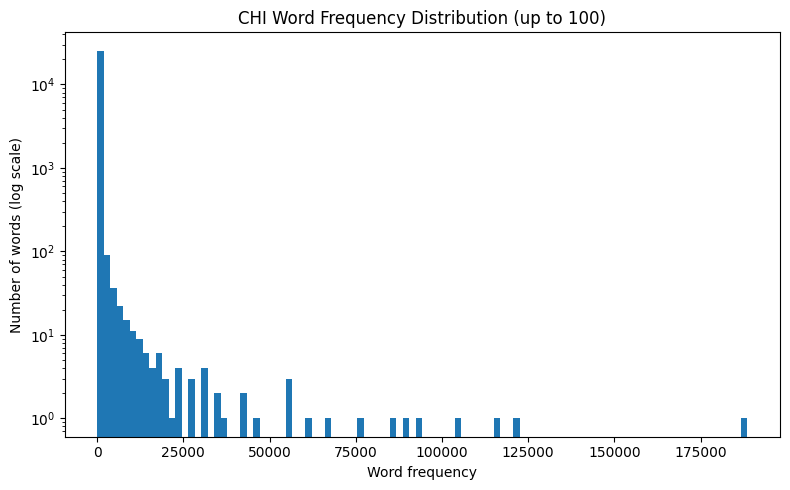

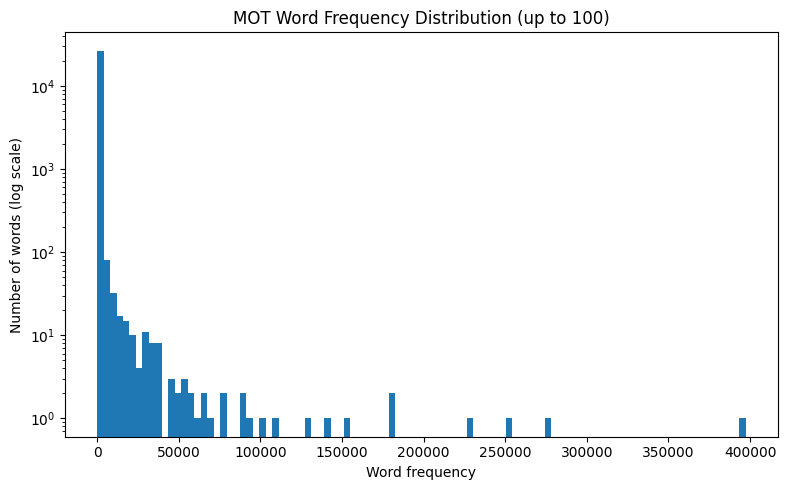

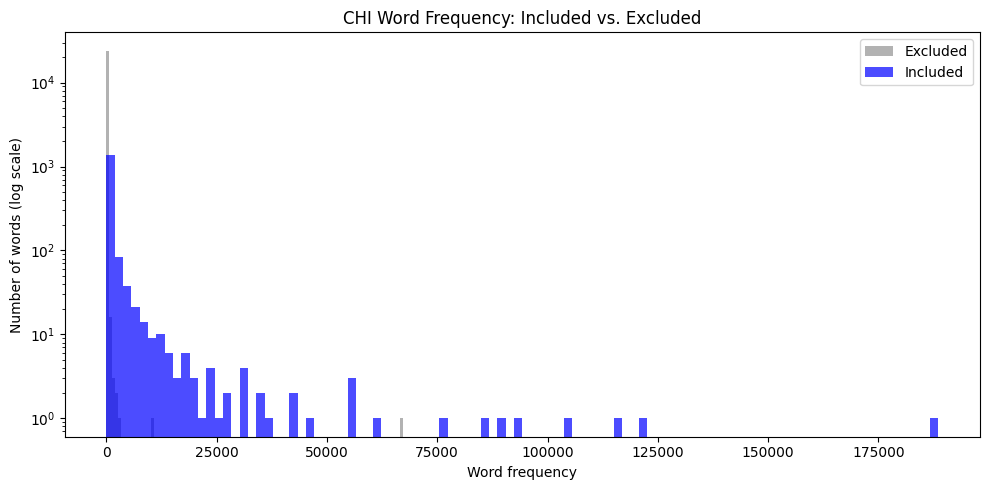

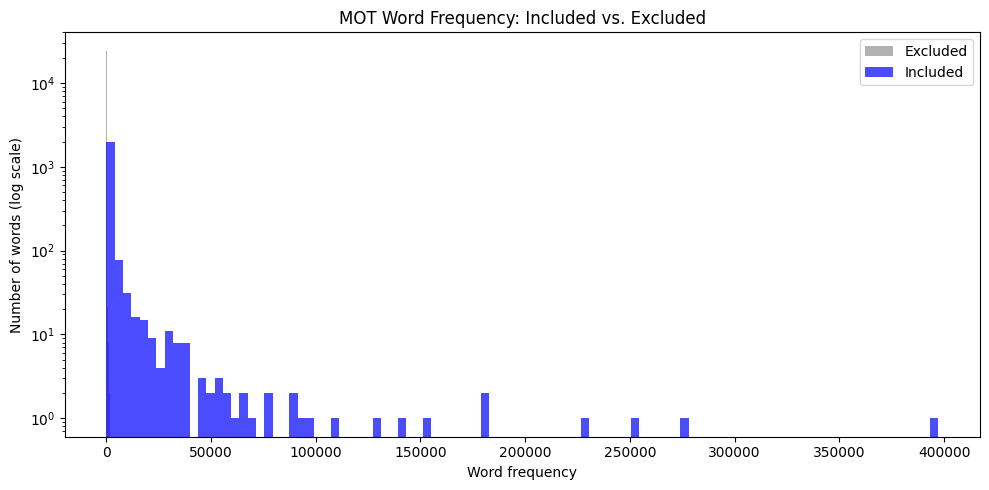


📊 CHI average word frequency (all words): 152.07
📉 CHI average frequency of excluded words: 15.67

📊 MOT average word frequency (all words): 285.72
📉 MOT average frequency of excluded words: 17.43

📊 CHI average relative frequency (all words): 0.00003901
📉 CHI average relative frequency (excluded words): 0.00000402

📊 MOT average relative frequency (all words): 0.00003743
📉 MOT average relative frequency (excluded words): 0.00000228

✅ CHI average frequency (included words): 2196.71
✅ MOT average frequency (included words): 3335.81


In [ ]:
import os
import re
import ast
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
min_freq = 10 

def extract_filtered_tokens(utt):
    raw_tokens = re.findall(r'\b\w+\b', utt)
    filtered = []
    for raw_token in raw_tokens:
        parts = raw_token.split("_") if "_" in raw_token else [raw_token]
        for token in parts:
            t = token.lower()
            if not t:
                continue
            if any(sym in t for sym in {"&", "@", "=", "{", "}"}):
                continue
            if any(sub in t for sub in {"babbl", "moan", "vocal"}):
                continue
            if any(char.isdigit() for char in t):
                continue
            if t in {"xxx", "yyy", "www", "nonspeech"}:
                continue
            if len(t) == 1 and t not in {"i", "a", "s"}:
                continue
            if len(t) == 3 and t[0] == t[1] == t[2]:
                continue
            if re.search(r"[aeiou]h$", t):
                continue
            if t in {"haha", "uhhum", "uhhuhhaw", "mm", "er", "ew", "ha", "hee"}:
                continue
            if "hm" in t or "mh" in t or "hrm" in t:
                continue
            if re.search(r"(.{2,}).*\1", t):
                continue
            filtered.append(t)
    return filtered

print("Loading dataset...")
df = pd.read_excel(file_path)
df["RelativePath"] = df["RelativePath"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

print("Preloading files...")
file_data = {}
chi_vocab_counter = Counter()
mot_vocab_counter = Counter()
chi_word_speaker_map = Counter()
mot_word_speaker_map = Counter()

all_paths = {p for paths in df["RelativePath"] for p in paths}

for rel_path in all_paths:
    full_path = os.path.join(root_dir, rel_path)
    if os.path.exists(full_path):
        try:
            with open(full_path, "r", encoding="utf-8") as f:
                text = f.read()
            lines = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)
            file_data[rel_path] = lines
        except Exception:
            continue

print("Counting tokens and mapping speakers...")
for idx, row in df.iterrows():
    numeric_id = row["NumericID"]
    for rel_path in row["RelativePath"]:
        if rel_path in file_data:
            for spk_code, utt in file_data[rel_path]:
                spk = spk_code.lstrip("*")
                tokens = extract_filtered_tokens(utt)
                token_set = set(tokens) 
                if spk == "CHI":
                    chi_vocab_counter.update(tokens)
                    for tok in token_set:
                        chi_word_speaker_map[(tok, numeric_id)] += 1
                elif spk == "MOT":
                    mot_vocab_counter.update(tokens)
                    for tok in token_set:
                        mot_word_speaker_map[(tok, numeric_id)] += 1

chi_speaker_counts = Counter()
for (tok, speaker_id) in chi_word_speaker_map:
    chi_speaker_counts[tok] += 1

mot_speaker_counts = Counter()
for (tok, speaker_id) in mot_word_speaker_map:
    mot_speaker_counts[tok] += 1

print(f"📊 Raw CHI vocab size (any frequency): {len(chi_vocab_counter)}")
print(f"📊 Raw MOT vocab size (any frequency): {len(mot_vocab_counter)}")

chi_vocab_final = {
    w for w in chi_vocab_counter
    if chi_vocab_counter[w] >= 50 and chi_speaker_counts[w] >= 35
}
mot_vocab_final = {
    w for w in mot_vocab_counter
    if mot_vocab_counter[w] >= 50 and mot_speaker_counts[w] >= 35
}

print(f"CHI vocab size (≥50 freq & ≥35 speakers): {len(chi_vocab_final)}")
print(f"MOT vocab size (≥50 freq & ≥35 speakers): {len(mot_vocab_final)}")

def plot_freq(counter, title):
    freqs = list(counter.values())
    plt.figure(figsize=(8,5))
    plt.hist(freqs, bins=100, log=True)
    plt.xlabel("Word frequency")
    plt.ylabel("Number of words (log scale)")
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_freq(chi_vocab_counter, "CHI Word Frequency Distribution (up to 100)")
plot_freq(mot_vocab_counter, "MOT Word Frequency Distribution (up to 100)")


chi_pass = {w for w in chi_vocab_counter if chi_vocab_counter[w] >= 50 and chi_speaker_counts[w] >= 35}
chi_fail = set(chi_vocab_counter) - chi_pass

mot_pass = {w for w in mot_vocab_counter if mot_vocab_counter[w] >= 50 and mot_speaker_counts[w] >= 35}
mot_fail = set(mot_vocab_counter) - mot_pass


def plot_pass_fail(counter, passed, failed, speaker_label):
    passed_freqs = [counter[w] for w in passed]
    failed_freqs = [counter[w] for w in failed]

    plt.figure(figsize=(10, 5))
    plt.hist(failed_freqs, bins=100, alpha=0.6, label="Excluded", color="gray", log=True)
    plt.hist(passed_freqs, bins=100, alpha=0.7, label="Included", color="blue", log=True)
    plt.xlabel("Word frequency")
    plt.ylabel("Number of words (log scale)")
    plt.title(f"{speaker_label} Word Frequency: Included vs. Excluded")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_pass_fail(chi_vocab_counter, chi_pass, chi_fail, "CHI")
plot_pass_fail(mot_vocab_counter, mot_pass, mot_fail, "MOT")



chi_all_avg = sum(chi_vocab_counter.values()) / len(chi_vocab_counter)
chi_excluded = set(chi_vocab_counter) - chi_vocab_final
chi_excluded_avg = sum(chi_vocab_counter[w] for w in chi_excluded) / len(chi_excluded)

mot_all_avg = sum(mot_vocab_counter.values()) / len(mot_vocab_counter)
mot_excluded = set(mot_vocab_counter) - mot_vocab_final
mot_excluded_avg = sum(mot_vocab_counter[w] for w in mot_excluded) / len(mot_excluded)

print(f"\n CHI average word frequency (all words): {chi_all_avg:.2f}")
print(f" CHI average frequency of excluded words: {chi_excluded_avg:.2f}")

print(f"\n MOT average word frequency (all words): {mot_all_avg:.2f}")
print(f" MOT average frequency of excluded words: {mot_excluded_avg:.2f}")


chi_total_tokens = sum(chi_vocab_counter.values())
mot_total_tokens = sum(mot_vocab_counter.values())

chi_rel_freq = {w: chi_vocab_counter[w] / chi_total_tokens for w in chi_vocab_counter}
mot_rel_freq = {w: mot_vocab_counter[w] / mot_total_tokens for w in mot_vocab_counter}

chi_rel_avg_all = sum(chi_rel_freq.values()) / len(chi_rel_freq)
mot_rel_avg_all = sum(mot_rel_freq.values()) / len(mot_rel_freq)

chi_excluded = set(chi_vocab_counter) - chi_vocab_final
mot_excluded = set(mot_vocab_counter) - mot_vocab_final

chi_rel_avg_excl = sum(chi_rel_freq[w] for w in chi_excluded) / len(chi_excluded)
mot_rel_avg_excl = sum(mot_rel_freq[w] for w in mot_excluded) / len(mot_excluded)

print(f"\n CHI average relative frequency (all words): {chi_rel_avg_all:.8f}")
print(f" CHI average relative frequency (excluded words): {chi_rel_avg_excl:.8f}")

print(f"\n MOT average relative frequency (all words): {mot_rel_avg_all:.8f}")
print(f" MOT average relative frequency (excluded words): {mot_rel_avg_excl:.8f}")


chi_included = chi_vocab_final
mot_included = mot_vocab_final

chi_avg_freq_incl = sum(chi_vocab_counter[w] for w in chi_included) / len(chi_included)
mot_avg_freq_incl = sum(mot_vocab_counter[w] for w in mot_included) / len(mot_included)

print(f"\n CHI average frequency (included words): {chi_avg_freq_incl:.2f}")
print(f" MOT average frequency (included words): {mot_avg_freq_incl:.2f}")



In [ ]:
print("\n🔍 Sample rare CHI words (excluded):")
rare_chi = sorted(chi_excluded, key=lambda w: (chi_vocab_counter[w], chi_speaker_counts[w]))
for w in rare_chi[:10]:
    print(f"{w} → freq={chi_vocab_counter[w]}, speakers={chi_speaker_counts[w]}")

print("\n🔍 Sample rare MOT words (excluded):")
rare_mot = sorted(mot_excluded, key=lambda w: (mot_vocab_counter[w], mot_speaker_counts[w]))
for w in rare_mot[:10]:
    print(f"{w} → freq={mot_vocab_counter[w]}, speakers={mot_speaker_counts[w]}")



🔍 Sample rare CHI words (excluded):
noisie → freq=1, speakers=1
doreena → freq=1, speakers=1
lullaby → freq=1, speakers=1
diabeattie → freq=1, speakers=1
supaman → freq=1, speakers=1
tricty → freq=1, speakers=1
pellim → freq=1, speakers=1
wawr → freq=1, speakers=1
sickle → freq=1, speakers=1
hawkin → freq=1, speakers=1

🔍 Sample rare MOT words (excluded):
whatch → freq=1, speakers=1
torturing → freq=1, speakers=1
darrenie → freq=1, speakers=1
heris → freq=1, speakers=1
stockpeep → freq=1, speakers=1
iname → freq=1, speakers=1
merkin → freq=1, speakers=1
sickle → freq=1, speakers=1
baf → freq=1, speakers=1
ghosty → freq=1, speakers=1


Summary Statistics

In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

mot_vars = [
    "MOT_Tokens", "MOT_Tokens_Content", "MOT_Turns",
    "MOT_AvgWordLength", "MOT_AvgTurnLength", "MOT_Concreteness"
]

chi_vars = [v.replace("MOT_", "CHI_") for v in mot_vars if v.replace("MOT_", "CHI_") in df.columns]

ordered_general_vars = ["Age_in_Days", "Gender", "Rel_MOT_Turns"]

label_map = {
    "Age_in_Days": "Child's age (in days)",
    "Gender": "Child's gender (1 = female)",
    "Rel_MOT_Turns": "Mother's Conversation Share",
    "Tokens": "Total Tokens",
    "Tokens_Content": "Content Tokens",
    "Turns": "Number of Turns",
    "AvgTurnLength": "Average Turn Length",
    "AvgWordLength": "Average Word Length",
    "Concreteness": "Average Concreteness"
}

variables = ordered_general_vars + mot_vars + chi_vars
variables = [v for v in variables if v in df.columns and pd.api.types.is_numeric_dtype(df[v])]
df_subset = df[variables].copy()

if "Gender" in df_subset.columns:
    df_subset["Gender"] = df_subset["Gender"].map({"male": 0, "female": 1})

latex_lines = []
latex_lines.append("\\renewcommand{\\arraystretch}{1.3}")
latex_lines.append("\\rowcolors{2}{gray!10}{white}")
latex_lines.append("\\begin{tabular}{lrrrrr}")
latex_lines.append("\\toprule")
latex_lines.append("Variable & Mean & SD & Min & Max & Median \\\\")
latex_lines.append("\\midrule")

for var in ordered_general_vars:
    if var in df_subset.columns:
        data = df_subset[var].dropna()
        label = label_map.get(var, var.replace("_", " "))
        latex_lines.append(
            f"{label} & {data.mean():.2f} & {data.std():.2f} & {data.min():.2f} & {data.max():.2f} & {data.median():.2f} \\\\"
        )

if "NumericID" in df.columns:
    timepoints = df["NumericID"].value_counts()
    latex_lines.insert(7,
        f"Observations per mother-child pair & {timepoints.mean():.2f} & {timepoints.std():.2f} & {timepoints.min():.2f} & {timepoints.max():.2f} & {timepoints.median():.2f} \\\\"
    )

base_vars = [v.replace("MOT_", "") for v in mot_vars]

for base in base_vars:
    mot_col = f"MOT_{base}"
    chi_col = f"CHI_{base}"
    label = label_map.get(base, base.replace("_", " "))
    if mot_col in df_subset.columns or chi_col in df_subset.columns:
        latex_lines.append(f"{label} & & & & & \\\\")
        if mot_col in df_subset.columns:
            data = df_subset[mot_col].dropna()
            latex_lines.append(
                f"\\hspace{{3mm}}Mother & {data.mean():.2f} & {data.std():.2f} & {data.min():.2f} & {data.max():.2f} & {data.median():.2f} \\\\"
            )
        if chi_col in df_subset.columns:
            data = df_subset[chi_col].dropna()
            latex_lines.append(
                f"\\hspace{{3mm}}Child & {data.mean():.2f} & {data.std():.2f} & {data.min():.2f} & {data.max():.2f} & {data.median():.2f} \\\\"
            )

latex_lines.append("\\bottomrule")
latex_lines.append("\\end{tabular}")

with open("summary_stats_longform_nospeakercol.tex", "w") as f:
    f.write("\n".join(latex_lines))

print("✅ Table saved with indented Mother/Child rows.")


✅ Table saved with indented Mother/Child rows.


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

df_unique = df.drop_duplicates(subset="NumericID")

gender_counts = df_unique["Gender"].value_counts(dropna=False)
gender_proportions = df_unique["Gender"].value_counts(normalize=True, dropna=False)

print("Gender counts per child:")
print(gender_counts)
print("\n Gender proportions per child:")
print(gender_proportions)


🔢 Gender counts per child:
Gender
male      297
female    280
Name: count, dtype: int64

📊 Gender proportions per child:
Gender
male      0.514731
female    0.485269
Name: proportion, dtype: float64


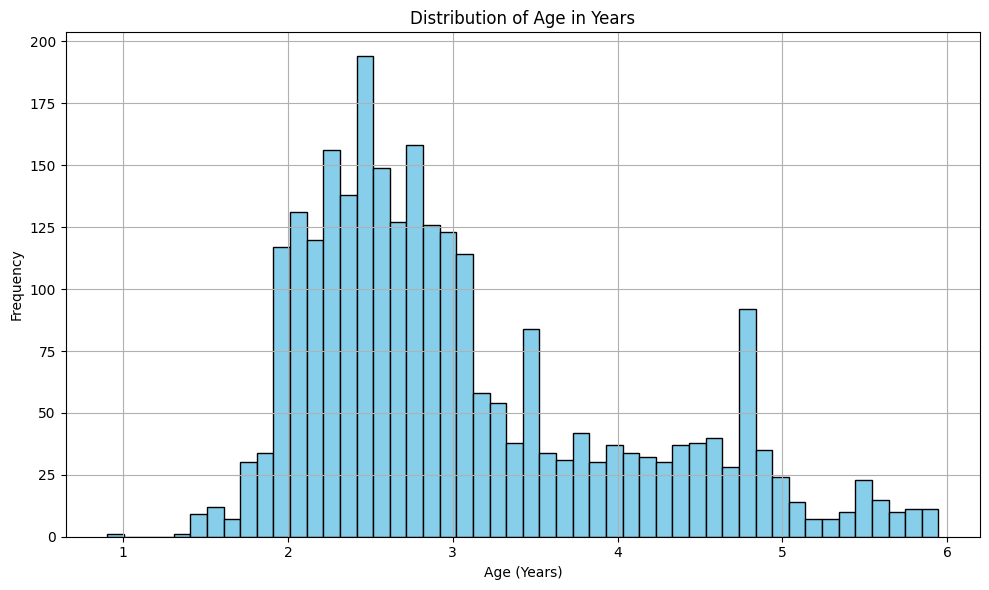

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

data_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(data_path)

df = df.dropna(subset=["Age_in_Days"])

df["Age_in_Days"] = pd.to_numeric(df["Age_in_Days"], errors="coerce")
df["Age_in_Years"] = df["Age_in_Days"] / 365.25

plt.figure(figsize=(10, 6))
plt.hist(df["Age_in_Years"], bins=50, color='skyblue', edgecolor='black')
plt.title("Distribution of Age in Years")
plt.xlabel("Age (Years)")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

study_info = df.groupby("Language")["Study"].agg([
    ("Num_Studies", lambda x: x.nunique()),
    ("Study_Names", lambda x: sorted(x.unique()))
])

print(study_info)


             Num_Studies                                        Study_Names
Language                                                                   
English UK            10  [Belfast, Edinburgh, Forrester, Howe, Lara, MP...
English USA           31  [Bates, Bliss, Bloom, Bohannon, Braunwald, Bro...


Most common words

In [ ]:
import os
import re
import ast
import time
import pandas as pd
import spacy
import nltk
from collections import defaultdict, Counter
from tqdm import tqdm
from functools import lru_cache
from nltk.corpus import wordnet as wn

nltk.download("wordnet")

start_time = time.time()

nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

root_dir = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Raw data"
file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"

df = pd.read_excel(file_path)

def parse_lists(val):
    if isinstance(val, str):
        if "|" in val:
            return val.split("|")
        if val.startswith("[") and val.endswith("]"):
            try:
                parsed = ast.literal_eval(val)
                if isinstance(parsed, list):
                    return parsed
            except:
                pass
        return [val]
    return val

df["RelativePath"] = df["RelativePath"].apply(parse_lists)

def extract_utterances(text):
    utterances = {"CHI": [], "MOT": []}
    matches = re.findall(r"^(\*[A-Z]+[A-Za-z0-9_]*):\s*(.*)", text, flags=re.MULTILINE)
    for speaker_code, utt in matches:
        speaker = speaker_code.lstrip("*")
        if speaker in utterances:
            tokens = re.findall(r'\b\w+\b', utt)
            tokens = [t for t in tokens if t.lower() not in {"xxx", "yyy", "www"}]
            if tokens:
                clean = " ".join(tokens)
                utterances[speaker].append(clean)
    return utterances

def spacy_to_wordnet_pos(spacy_pos):
    return {
        "NOUN": wn.NOUN,
        "VERB": wn.VERB,
        "ADJ": wn.ADJ,
        "ADV": wn.ADV
    }.get(spacy_pos, None)

@lru_cache(maxsize=100000)
def get_lexname(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    return synsets[0].lexname() if synsets else None

@lru_cache(maxsize=100000)
def get_top_hypernym(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    if not synsets:
        return None
    try:
        current = synsets[0]
        while current.hypernyms():
            current = current.hypernyms()[0]
        return current.name().split('.')[0]
    except:
        return None

@lru_cache(maxsize=100000)
def get_synset_id(word, wn_pos):
    if wn_pos is None:
        return None
    synsets = wn.synsets(word, pos=wn_pos)
    return synsets[0].name() if synsets else None

content_pos = {"NOUN", "VERB", "ADJ", "ADV"}

print(f"Processing {len(df)} rows...")

results = []

for idx, row in tqdm(df.iterrows(), total=len(df)):
    paths = row["RelativePath"]
    if not isinstance(paths, list):
        paths = [paths]

    utterances_by_speaker = {"CHI": [], "MOT": []}
    for p in paths:
        full_path = os.path.join(root_dir, p)
        if not os.path.exists(full_path):
            print(f"Missing file: {p} (Row {idx})")
            continue
        try:
            with open(full_path, "r", encoding="utf-8") as f:
                text = f.read()
            utts = extract_utterances(text)
            for spk in ["CHI", "MOT"]:
                utterances_by_speaker[spk].extend(utts[spk])
        except Exception as e:
            print(f"Error reading {p} (Row {idx}): {e}")

    row_result = {}

    for speaker in ["CHI", "MOT"]:
        combined_text = " ".join(utterances_by_speaker[speaker])
        if not combined_text.strip():
            for typename in ["Lemma", "LemmaPOS", "Content", "ContentLemma", "ContentLemmaPOS", "Lex", "Hyper", "Syn"]:
                for i in range(1,6):
                    row_result[f"{speaker}_Top{i}_{typename}"] = None
                    row_result[f"{speaker}_Top{i}_{typename}_Freq"] = None
            continue

        doc = nlp(combined_text)

        toks_lemma = []
        toks_lemmapos = []
        toks_content = []
        toks_contentlemma = []
        toks_contentlemmapos = []
        toks_lex = []
        toks_hyper = []
        toks_syn = []

        for token in doc:
            if not token.is_alpha:
                continue

            lemma = token.lemma_.lower()
            word = token.text.lower()
            pos = token.pos_
            wn_pos = spacy_to_wordnet_pos(pos)

            toks_lemma.append(lemma)
            toks_lemmapos.append((lemma, pos))

            if pos in content_pos:
                toks_content.append(word)
                toks_contentlemma.append(lemma)
                toks_contentlemmapos.append((lemma, pos))

                lex = get_lexname(lemma, wn_pos)
                if lex:
                    toks_lex.append(lex)
                hyp = get_top_hypernym(lemma, wn_pos)
                if hyp:
                    toks_hyper.append(hyp)
                syn = get_synset_id(lemma, wn_pos)
                if syn:
                    toks_syn.append(syn)

        token_lists = {
            "Lemma": toks_lemma,
            "LemmaPOS": toks_lemmapos,
            "Content": toks_content,
            "ContentLemma": toks_contentlemma,
            "ContentLemmaPOS": toks_contentlemmapos,
            "Lex": toks_lex,
            "Hyper": toks_hyper,
            "Syn": toks_syn
        }

        for typename, toks in token_lists.items():
            freq = Counter(toks)
            total = sum(freq.values())
            top5 = freq.most_common(5)
            for i in range(5):
                if i < len(top5):
                    word_, count = top5[i]
                    row_result[f"{speaker}_Top{i+1}_{typename}"] = word_
                    row_result[f"{speaker}_Top{i+1}_{typename}_Freq"] = count / total if total > 0 else None
                else:
                    row_result[f"{speaker}_Top{i+1}_{typename}"] = None
                    row_result[f"{speaker}_Top{i+1}_{typename}_Freq"] = None

    results.append(row_result)

df_newcols = pd.DataFrame(results)
df = pd.concat([df, df_newcols], axis=1)

df.to_excel(file_path, index=False)

elapsed = time.time() - start_time
print(f"Done in {elapsed/60:.2f} minutes. All top-5 freq columns added for CHI and MOT for all type versions.")


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\isa97\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Processing 4131 rows...


100%|██████████| 4131/4131 [25:58<00:00,  2.65it/s]  


✅ Done in 27.32 minutes. All top-5 freq columns added for CHI and MOT for all type versions.


In [ ]:
import pandas as pd
from collections import defaultdict

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"

df = pd.read_excel(file_path)

word_summary = defaultdict(lambda: defaultdict(list))  

for col in df.columns:
    if re.match(r"(CHI|MOT)_Top[1-5]_.+[^_Freq]$", col):
        freq_col = col + "_Freq"
        if freq_col in df.columns:
            for word, freq in zip(df[col], df[freq_col]):
                if pd.notna(word) and pd.notna(freq):
                    word_summary[col][word].append(freq)

rows = []
for col, word_freqs in word_summary.items():
    for word, freqs in word_freqs.items():
        rows.append({
            "Column": col,
            "WordOrCategory": word,
            "Count": len(freqs),
            "MeanFreq": sum(freqs) / len(freqs),
            "MaxFreq": max(freqs),
            "MinFreq": min(freqs)
        })

summary_df = pd.DataFrame(rows)
summary_df.to_excel("TopFreq_Summary.xlsx", index=False)


Time Trends

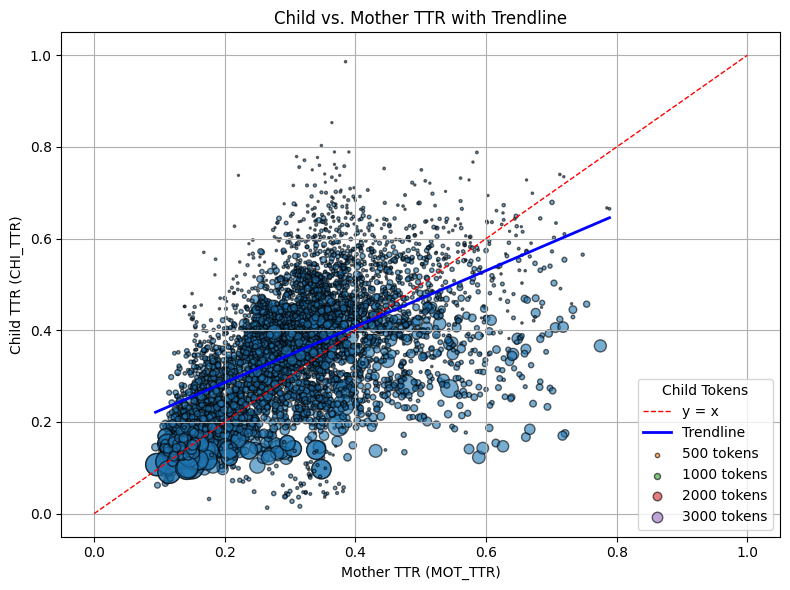

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)



df_plot = df_filtered[
    df_filtered["CHI_TTR"].notna() &
    df_filtered["MOT_TTR"].notna() &
    df_filtered["CHI_Tokens"].notna()
].copy()

df_plot["CHI_TTR"] = pd.to_numeric(df_plot["CHI_TTR"], errors="coerce")
df_plot["MOT_TTR"] = pd.to_numeric(df_plot["MOT_TTR"], errors="coerce")
df_plot["CHI_Tokens"] = pd.to_numeric(df_plot["CHI_Tokens"], errors="coerce")

size_scaled = df_plot["CHI_Tokens"] / df_plot["CHI_Tokens"].max() * 300

plt.figure(figsize=(8, 6))
plt.scatter(
    df_plot["MOT_TTR"],
    df_plot["CHI_TTR"],
    s=size_scaled,
    alpha=0.6,
    edgecolors="k"
)

plt.plot([0, 1], [0, 1], 'r--', linewidth=1, label="y = x")

slope, intercept = np.polyfit(df_plot["MOT_TTR"], df_plot["CHI_TTR"], 1)
x_vals = np.linspace(df_plot["MOT_TTR"].min(), df_plot["MOT_TTR"].max(), 100)
y_vals = slope * x_vals + intercept
plt.plot(x_vals, y_vals, color="blue", linestyle="-", linewidth=2, label="Trendline")

for tokens in [500, 1000, 2000, 3000]:
    dot_size = min(tokens / df_plot["CHI_Tokens"].max() * 300, 300)
    plt.scatter([], [], s=dot_size, edgecolors="k", alpha=0.6, label=f"{tokens} tokens")

plt.legend(title="Child Tokens", loc="lower right", frameon=True)
plt.xlabel("Mother TTR (MOT_TTR)")
plt.ylabel("Child TTR (CHI_TTR)")
plt.title("Child vs. Mother TTR with Trendline")
plt.grid(True)
plt.tight_layout()
plt.show()


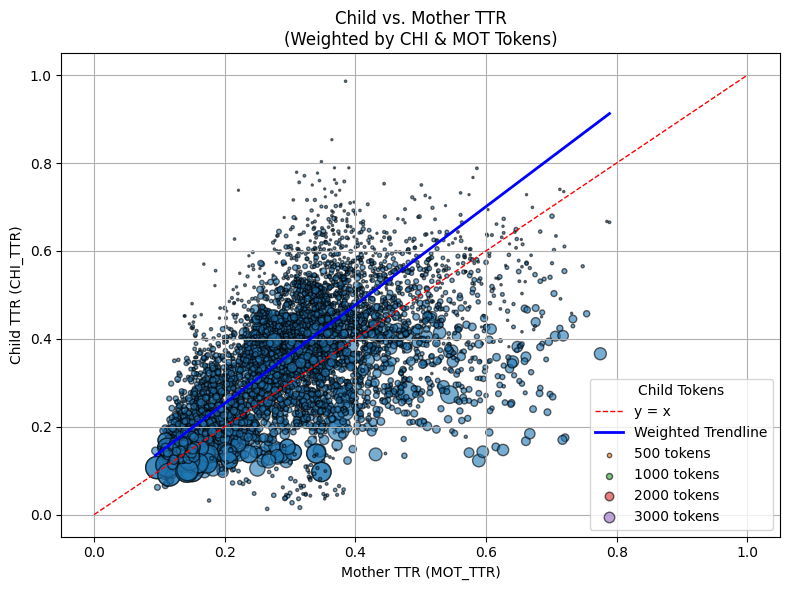

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)



df_plot = df_filtered[
    df_filtered["CHI_TTR"].notna() &
    df_filtered["MOT_TTR"].notna() &
    df_filtered["CHI_Tokens"].notna() &
    df_filtered["MOT_Tokens"].notna()
].copy()

df_plot["CHI_TTR"] = pd.to_numeric(df_plot["CHI_TTR"], errors="coerce")
df_plot["MOT_TTR"] = pd.to_numeric(df_plot["MOT_TTR"], errors="coerce")
df_plot["CHI_Tokens"] = pd.to_numeric(df_plot["CHI_Tokens"], errors="coerce")
df_plot["MOT_Tokens"] = pd.to_numeric(df_plot["MOT_Tokens"], errors="coerce")

weights = (df_plot["CHI_Tokens"] + df_plot["MOT_Tokens"]) / 2

size_scaled = df_plot["CHI_Tokens"] / df_plot["CHI_Tokens"].max() * 300


plt.figure(figsize=(8, 6))
plt.scatter(
    df_plot["MOT_TTR"],
    df_plot["CHI_TTR"],
    s=size_scaled,
    alpha=0.6,
    edgecolors="k"
)

plt.plot([0, 1], [0, 1], 'r--', linewidth=1, label="y = x")

slope, intercept = np.polyfit(
    df_plot["MOT_TTR"],
    df_plot["CHI_TTR"],
    deg=1,
    w=weights
)
x_vals = np.linspace(df_plot["MOT_TTR"].min(), df_plot["MOT_TTR"].max(), 100)
y_vals = slope * x_vals + intercept
plt.plot(x_vals, y_vals, color="blue", linewidth=2, label="Weighted Trendline")

for tokens in [500, 1000, 2000, 3000]:
    dot_size = min(tokens / df_plot["CHI_Tokens"].max() * 300, 300)
    plt.scatter([], [], s=dot_size, edgecolors="k", alpha=0.6, label=f"{tokens} tokens")

plt.legend(title="Child Tokens", loc="lower right", frameon=True)
plt.xlabel("Mother TTR (MOT_TTR)")
plt.ylabel("Child TTR (CHI_TTR)")
plt.title("Child vs. Mother TTR\n(Weighted by CHI & MOT Tokens)")
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\699048050.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby("Age_Group_Years")[col].apply(compute_mean_ci).unstack()
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\699048050.py:23: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem = stats.sem(series)
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\699048050.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby("Age_Group_Years")[col].apply(compute_mean_ci).unstack

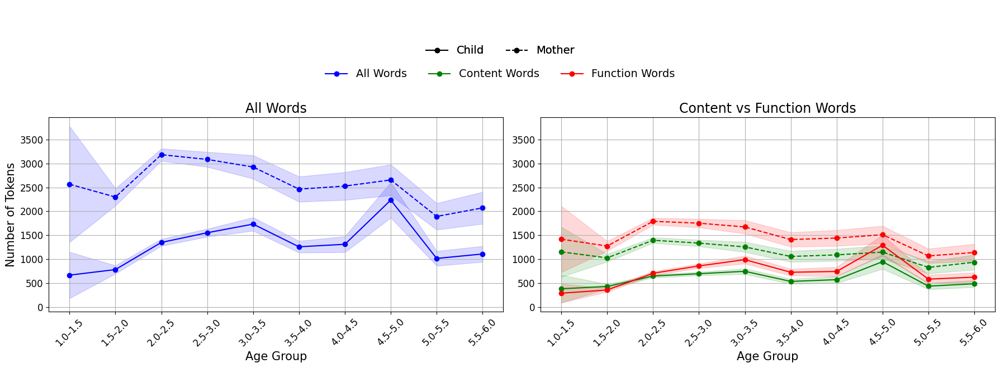

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.lines import Line2D


file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

df["Age_in_Years"] = df["Age_in_Days"] / 365.25
bins = np.arange(0, 12.5, 0.5)
labels = [f"{b:.1f}–{b+0.5:.1f}" for b in bins[:-1]]
df["Age_Group_Years"] = pd.cut(df["Age_in_Years"], bins=bins, labels=labels, right=False)
bins_to_drop = ["0.0–0.5", "0.5–1.0"]

def compute_mean_ci(series):
    series = series.dropna()
    mean = series.mean()
    sem = stats.sem(series)
    ci = 1.96 * sem if len(series) > 1 else np.nan
    return pd.Series({"mean": mean, "lower": mean - ci, "upper": mean + ci})

word_types = [
    ("Tokens", "All Words", "blue"),
    ("Tokens_Content", "Content Words", "green"),
    ("Tokens_Function", "Function Words", "red")
]

y_vals = []
for base, _, _ in word_types:
    for speaker in ["CHI", "MOT"]:
        col = f"{speaker}_{base}"
        grouped = df.groupby("Age_Group_Years")[col].apply(compute_mean_ci).unstack()
        grouped = grouped.loc[~grouped.index.isin(bins_to_drop)]
        y_vals.extend(grouped["lower"].tolist() + grouped["upper"].tolist())

ymin = np.nanmin(y_vals)
ymax = np.nanmax(y_vals)
margin = (ymax - ymin) * 0.05
y_limits = (ymin - margin, ymax + margin)

fig, axs = plt.subplots(1, 2, figsize=(18, 6), sharex=True)

base, label, color = word_types[0]
ax = axs[0]

for speaker, linestyle, role in [("CHI", "-", "Child"), ("MOT", "--", "Mother")]:
    col = f"{speaker}_{base}"
    grouped = df.groupby("Age_Group_Years")[col].apply(compute_mean_ci).unstack()
    grouped = grouped.loc[~grouped.index.isin(bins_to_drop)]

    ax.plot(grouped.index, grouped["mean"], linestyle=linestyle, marker="o", color=color, label=f"{role} – {label}")
    ax.fill_between(grouped.index, grouped["lower"], grouped["upper"], color=color, alpha=0.15)

ax.set_title("All Words", fontsize=17)
ax.set_ylim(*y_limits)
ax.grid(True)
ax.tick_params(axis="x", rotation=45, labelsize=12)
ax.tick_params(axis="y", labelsize=12)
ax.set_xlabel("Age Group", fontsize=15)  




ax = axs[1]

for base, label, color in word_types[1:]:
    for speaker, linestyle, role in [("CHI", "-", "Child"), ("MOT", "--", "Mother")]:
        col = f"{speaker}_{base}"
        grouped = df.groupby("Age_Group_Years")[col].apply(compute_mean_ci).unstack()
        grouped = grouped.loc[~grouped.index.isin(bins_to_drop)]

        ax.plot(grouped.index, grouped["mean"], linestyle=linestyle, marker="o", color=color, label=f"{role} – {label}")
        ax.fill_between(grouped.index, grouped["lower"], grouped["upper"], color=color, alpha=0.15)

ax.set_title("Content vs Function Words", fontsize=17)
ax.set_ylim(*y_limits)
ax.grid(True)
ax.tick_params(axis="x", rotation=45, labelsize=12)
ax.tick_params(axis="y", labelsize=12)



axs[0].set_ylabel("Number of Tokens", fontsize=15)
ax.set_xlabel("Age Group", fontsize=15)


style_legend = [
    Line2D([0], [0], color='black', linestyle='-', marker='o', label='Child'),
    Line2D([0], [0], color='black', linestyle='--', marker='o', label='Mother')
]

color_legend = [
    Line2D([0], [0], color='blue', linestyle='-', marker='o', label='All Words'),
    Line2D([0], [0], color='green', linestyle='-', marker='o', label='Content Words'),
    Line2D([0], [0], color='red', linestyle='-', marker='o', label='Function Words')
]

legend1 = fig.legend(
    handles=style_legend,
    loc='upper center',
    bbox_to_anchor=(0.5, 1), 
    ncol=2,
    frameon=False,
    fontsize=14
)

legend2 = fig.legend(
    handles=color_legend,
    loc='upper center',
    bbox_to_anchor=(0.5, 0.93),
    ncol=3,
    frameon=False,
    fontsize=14
)

fig.add_artist(legend1)



fig.suptitle("Token Counts by Age Group", fontsize=22, y=1.09, color='white')


plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()


C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\1657702153.py:71: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\1657702153.py:34: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem = stats.sem(series)
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\1657702153.py:72: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compu

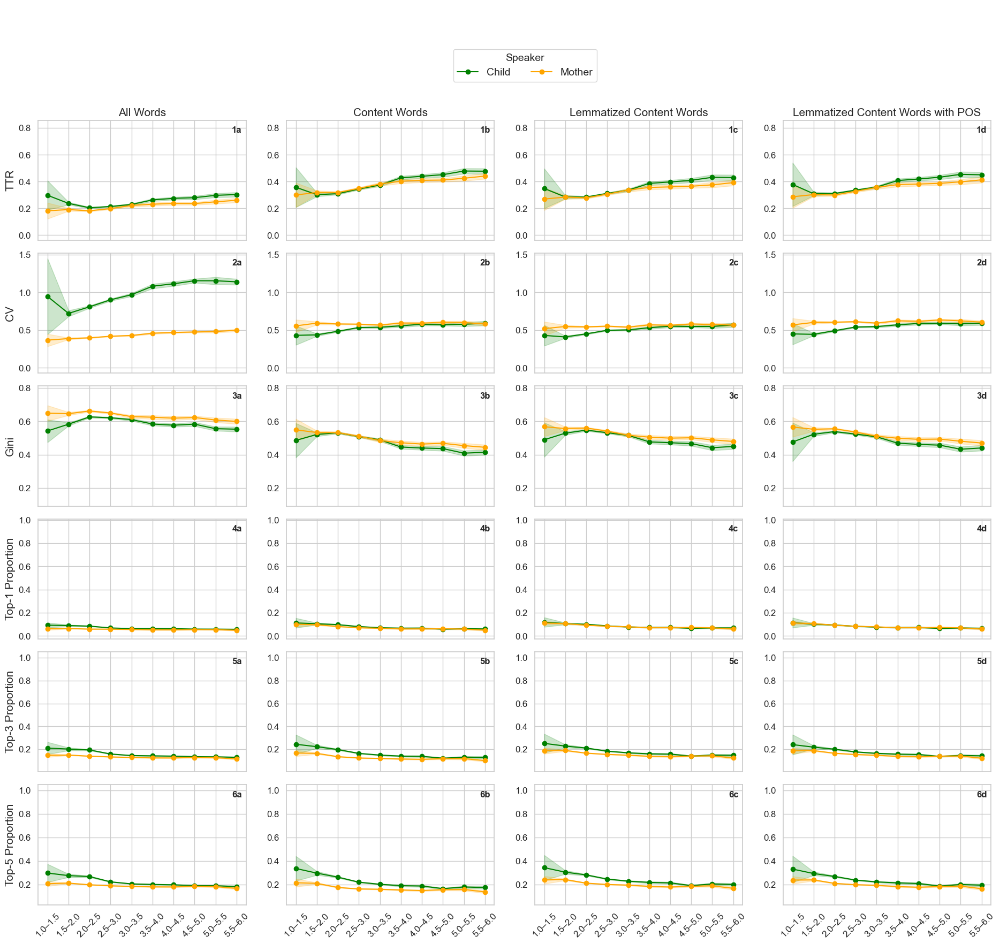

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

df["Age_in_Years"] = df["Age_in_Days"] / 365.25

bins = np.arange(0, 12.5, 0.5)
labels = [f"{b:.1f}–{b+0.5:.1f}" for b in bins[:-1]]
df["Age_Group_Years"] = pd.cut(df["Age_in_Years"], bins=bins, labels=labels, right=False)


metric_display_names = {
    "TTR": "TTR",
    "CV": "CV",
    "Gini": "Gini",
    "MaxDominance": "Top-1 Proportion",
    "Top3Dominance": "Top-3 Proportion",
    "Top5Dominance": "Top-5 Proportion"
}


def compute_mean_ci(series):
    series = series.dropna()
    mean = series.mean()
    sem = stats.sem(series)
    ci = 1.96 * sem if len(series) > 1 else np.nan
    return pd.Series({"mean": mean, "lower": mean - ci, "upper": mean + ci, "count": len(series)})

ttr_bases = [
    ("Raw", "All Words"),
    ("Content", "Content Words"),
    ("ContentLemma", "Lemmatized Content Words"),
    ("ContentLemmaPOS", "Lemmatized Content Words with POS"),
]

inequality_metrics = ["TTR", "CV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]


prefixes = ["EmbWord", "EmbUtt"]

thresholds = ["t0.25", "t0.50", "t0.75"]
embedding_suffixes = [f"{p}_{t}" for p in prefixes for t in thresholds]
ttr_suffixes = ["Raw", "Content", "ContentLemma", "ContentLemmaPOS", "Syn", "Lex"]
all_suffixes = embedding_suffixes + ttr_suffixes


inequality_metrics = ["TTR", "CV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]
bins_to_drop = ["0.0–0.5", "0.5–1.0"]

y_limits = []
for metric in inequality_metrics:
    y_values = []
    for suffix in all_suffixes:
        chi_col = f"CHI_{metric}_{suffix}" if metric != "TTR" else f"CHI_TTR_{suffix}"
        mot_col = f"MOT_{metric}_{suffix}" if metric != "TTR" else f"MOT_TTR_{suffix}"

        if chi_col not in df.columns or mot_col not in df.columns:
            continue

        grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
        grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compute_mean_ci).unstack()

        grouped_chi = grouped_chi.loc[~grouped_chi.index.isin(bins_to_drop)]
        grouped_mot = grouped_mot.loc[grouped_mot.index.isin(grouped_chi.index)]

        y_values.extend(grouped_chi["lower"].tolist() + grouped_chi["upper"].tolist())
        y_values.extend(grouped_mot["lower"].tolist() + grouped_mot["upper"].tolist())

    min_y = np.nanmin(y_values)
    max_y = np.nanmax(y_values)
    margin = (max_y - min_y) * 0.05
    y_limits.append((min_y - margin, max_y + margin))

fig, axs = plt.subplots(len(inequality_metrics), len(ttr_bases), figsize=(20, 18), sharex=True)
axs = np.array(axs)

for col_index, (base, title_prefix) in enumerate(ttr_bases):
    for row_index, metric in enumerate(inequality_metrics):
        chi_col = f"CHI_{metric}_{base}" if metric != "TTR" else f"CHI_TTR_{base}"
        mot_col = f"MOT_{metric}_{base}" if metric != "TTR" else f"MOT_TTR_{base}"

        grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
        grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compute_mean_ci).unstack()

        grouped_chi = grouped_chi.loc[~grouped_chi.index.isin(bins_to_drop)]
        grouped_mot = grouped_mot.loc[grouped_mot.index.isin(grouped_chi.index)]

        ax = axs[row_index, col_index]
        subplot_label = f"{row_index + 1}{chr(97 + col_index)}"

        ax.text(
            0.98, 0.95, subplot_label,
            transform=ax.transAxes,
            ha="right", va="top",
            fontsize=12, fontweight="bold"
        )

        ax.plot(grouped_chi.index, grouped_chi["mean"], marker="o", markersize=6, color="green", label="Child")
        ax.fill_between(grouped_chi.index, grouped_chi["lower"], grouped_chi["upper"], color="green", alpha=0.2)

        ax.plot(grouped_mot.index, grouped_mot["mean"], marker="o", markersize=6, color="orange", label="Mother")
        ax.fill_between(grouped_mot.index, grouped_mot["lower"], grouped_mot["upper"], color="orange", alpha=0.2)

        ax.set_ylim(*y_limits[row_index])

        if row_index == 0:
            ax.set_title(title_prefix, fontsize=15)
        if col_index == 0:
            ax.set_ylabel(metric_display_names.get(metric, metric), fontsize=15)

        ax.tick_params(axis='x', rotation=45)
        ax.grid(True)

handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, title="Speaker", loc="upper center", bbox_to_anchor=(0.5, 0.94), ncol=2, prop={'size': 14}, title_fontsize=14 )
fig.suptitle("b", color='white', fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0, 0.95, 0.91])
plt.show()


C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\1063886613.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\1063886613.py:31: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem = stats.sem(series)
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\1063886613.py:57: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compu

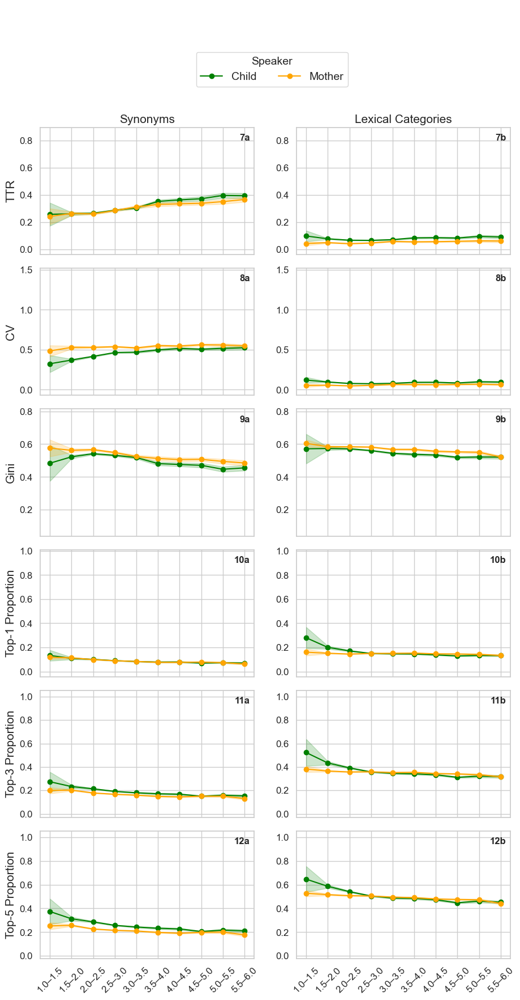

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

df["Age_in_Years"] = df["Age_in_Days"] / 365.25
bins = np.arange(0, 12.5, 0.5)
labels = [f"{b:.1f}–{b+0.5:.1f}" for b in bins[:-1]]
df["Age_Group_Years"] = pd.cut(df["Age_in_Years"], bins=bins, labels=labels, right=False)

metric_display_names = {
    "TTR": "TTR",
    "CV": "CV",
    "Gini": "Gini",
    "MaxDominance": "Top-1 Proportion",
    "Top3Dominance": "Top-3 Proportion",
    "Top5Dominance": "Top-5 Proportion"
}


def compute_mean_ci(series):
    series = series.dropna()
    mean = series.mean()
    sem = stats.sem(series)
    ci = 1.96 * sem if len(series) > 1 else np.nan
    return pd.Series({"mean": mean, "lower": mean - ci, "upper": mean + ci, "count": len(series)})

prefixes = ["EmbWord", "ContextEmb", "EmbUtt", "ContextCount"]
thresholds = ["t0.25", "t0.50", "t0.75"]
embedding_suffixes = [f"{p}_{t}" for p in prefixes for t in thresholds]
ttr_suffixes = ["Raw", "Content", "ContentLemma", "ContentLemmaPOS"]
symbolic_suffixes = ["Syn", "Lex"]
all_suffixes = embedding_suffixes + ttr_suffixes + symbolic_suffixes

metrics = ["TTR", "CV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]
bins_to_drop = ["0.0–0.5", "0.5–1.0"]

y_limits = []
for metric in metrics:
    y_values = []
    for suffix in all_suffixes:
        chi_col = f"CHI_{metric}_{suffix}" if metric != "TTR" else f"CHI_TTR_{suffix}"
        mot_col = f"MOT_{metric}_{suffix}" if metric != "TTR" else f"MOT_TTR_{suffix}"

        if chi_col not in df.columns or mot_col not in df.columns:
            continue

        grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
        grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compute_mean_ci).unstack()

        grouped_chi = grouped_chi.loc[~grouped_chi.index.isin(bins_to_drop)]
        grouped_mot = grouped_mot.loc[grouped_mot.index.isin(grouped_chi.index)]

        y_values.extend(grouped_chi["lower"].tolist() + grouped_chi["upper"].tolist())
        y_values.extend(grouped_mot["lower"].tolist() + grouped_mot["upper"].tolist())

    min_y = np.nanmin(y_values)
    max_y = np.nanmax(y_values)
    margin = (max_y - min_y) * 0.05
    y_limits.append((min_y - margin, max_y + margin))

semantic_types = [
    ("Syn", "Synonyms"),
    ("Lex", "Lexical Categories"),
]

metrics = ["TTR", "CV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]
bins_to_drop = ["0.0–0.5", "0.5–1.0"]

fig, axs = plt.subplots(len(metrics), len(semantic_types), figsize=(10, 18), sharex=True)
axs = np.array(axs)

for col_index, (semantic_suffix, semantic_label) in enumerate(semantic_types):
    for row_index, metric in enumerate(metrics):
        chi_col = f"CHI_{metric}_{semantic_suffix}"
        mot_col = f"MOT_{metric}_{semantic_suffix}"

        grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
        grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compute_mean_ci).unstack()

        grouped_chi = grouped_chi.loc[~grouped_chi.index.isin(bins_to_drop)]
        grouped_mot = grouped_mot.loc[grouped_mot.index.isin(grouped_chi.index)]

        ax = axs[row_index, col_index]

        subplot_label = f"{row_index + 7}{chr(97 + col_index)}"
        ax.text(
            0.98, 0.95, subplot_label,
            transform=ax.transAxes,
            ha="right", va="top",
            fontsize=12, fontweight="bold"
        )

        ax.plot(grouped_chi.index, grouped_chi["mean"], marker="o", markersize=6, color="green", label="Child")
        ax.fill_between(grouped_chi.index, grouped_chi["lower"], grouped_chi["upper"], color="green", alpha=0.2)


        ax.plot(grouped_mot.index, grouped_mot["mean"], marker="o", markersize=6, color="orange", label="Mother")
        ax.fill_between(grouped_mot.index, grouped_mot["lower"], grouped_mot["upper"], color="orange", alpha=0.2)

        ax.set_ylim(*y_limits[row_index])


        if row_index == 0:
            ax.set_title(semantic_label, fontsize=15)

        if col_index == 0:
            ax.set_ylabel(metric_display_names.get(metric, metric), fontsize=15)

        ax.tick_params(axis='x', rotation=45)
        ax.grid(True)

handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, title="Speaker", loc="upper center", bbox_to_anchor=(0.5, 0.94), ncol=2, prop={'size': 14}, title_fontsize=14 )
fig.suptitle("h", color='white', fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0, 0.95, 0.91])
plt.show()



C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\2164298351.py:64: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\2164298351.py:35: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem = stats.sem(series)
C:\Users\isa97\AppData\Local\Temp\ipykernel_12388\2164298351.py:65: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compu

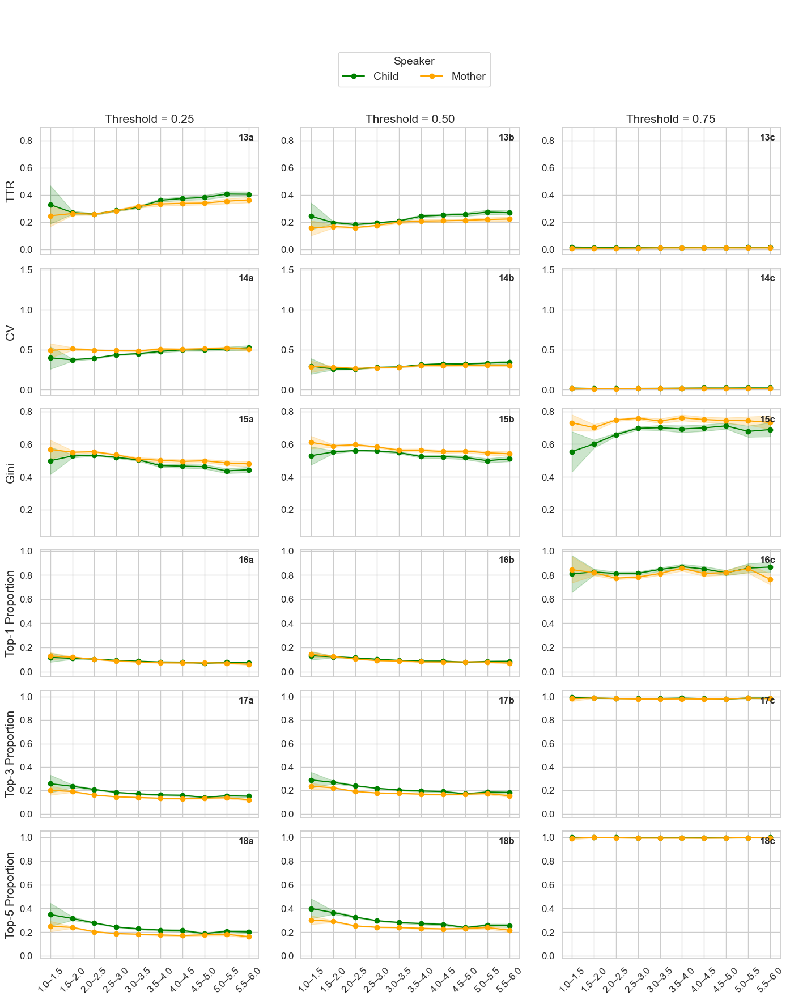

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2.xlsx"
df = pd.read_excel(file_path)

df["Age_in_Years"] = df["Age_in_Days"] / 365.25

bins = np.arange(0, 12.5, 0.5)
labels = [f"{b:.1f}–{b+0.5:.1f}" for b in bins[:-1]]
df["Age_Group_Years"] = pd.cut(df["Age_in_Years"], bins=bins, labels=labels, right=False)

bins_to_drop = ["0.0–0.5", "0.5–1.0"]

metric_display_names = {
    "TTR": "TTR",
    "CV": "CV",
    "Gini": "Gini",
    "MaxDominance": "Top-1 Proportion",
    "Top3Dominance": "Top-3 Proportion",
    "Top5Dominance": "Top-5 Proportion"
}

def compute_mean_ci(series):
    series = series.dropna()
    mean = series.mean()
    sem = stats.sem(series)
    ci = 1.96 * sem if len(series) > 1 else np.nan
    return pd.Series({"mean": mean, "lower": mean - ci, "upper": mean + ci, "count": len(series)})

inequality_metrics = ["TTR", "CV", "Gini", "MaxDominance", "Top3Dominance", "Top5Dominance"]
embedding_bases = ["EmbWord", "ContextEmb", "EmbUtt", "ContextCount"]
thresholds = ["t0.25", "t0.50", "t0.75"]
symbolic_suffixes = ["Syn", "Lex"]
ttr_suffixes = ["Raw", "Content", "ContentLemma", "ContentLemmaPOS"]

prefixes = ["EmbWord", "ContextEmb", "EmbUtt", "ContextCount"]
thresholds = ["t0.25", "t0.50", "t0.75"]
embedding_suffixes = [f"{p}_{t}" for p in prefixes for t in thresholds]
ttr_suffixes = ["Raw", "Content", "ContentLemma", "ContentLemmaPOS"]
symbolic_suffixes = ["Syn", "Lex"]
all_suffixes = embedding_suffixes + ttr_suffixes + symbolic_suffixes

y_limits = []
for metric in inequality_metrics:
    y_values = []
    for suffix in all_suffixes:
        chi_col = f"CHI_{metric}_{suffix}" if metric != "TTR" else f"CHI_TTR_{suffix}"
        mot_col = f"MOT_{metric}_{suffix}" if metric != "TTR" else f"MOT_TTR_{suffix}"

        if chi_col not in df.columns or mot_col not in df.columns:
            continue

        grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
        grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compute_mean_ci).unstack()

        grouped_chi = grouped_chi.loc[~grouped_chi.index.isin(bins_to_drop)]
        grouped_mot = grouped_mot.loc[grouped_mot.index.isin(grouped_chi.index)]

        y_values.extend(grouped_chi["lower"].tolist() + grouped_chi["upper"].tolist())
        y_values.extend(grouped_mot["lower"].tolist() + grouped_mot["upper"].tolist())

    min_y = np.nanmin(y_values)
    max_y = np.nanmax(y_values)
    margin = (max_y - min_y) * 0.05
    y_limits.append((min_y - margin, max_y + margin))


plot_suffixes = [f"EmbWord_{t}" for t in thresholds]
fig, axs = plt.subplots(len(inequality_metrics), len(plot_suffixes), figsize=(15, 18), sharex=True)
axs = np.array(axs)

for col_index, suffix in enumerate(plot_suffixes):
    for row_index, metric in enumerate(inequality_metrics):
        chi_col = f"CHI_{metric}_{suffix}" if metric != "TTR" else f"CHI_TTR_{suffix}"
        mot_col = f"MOT_{metric}_{suffix}" if metric != "TTR" else f"MOT_TTR_{suffix}"

        if chi_col not in df.columns or mot_col not in df.columns:
            continue

        grouped_chi = df.groupby("Age_Group_Years")[chi_col].apply(compute_mean_ci).unstack()
        grouped_mot = df.groupby("Age_Group_Years")[mot_col].apply(compute_mean_ci).unstack()

        grouped_chi = grouped_chi.loc[~grouped_chi.index.isin(bins_to_drop)]
        grouped_mot = grouped_mot.loc[grouped_mot.index.isin(grouped_chi.index)]

        ax = axs[row_index, col_index]
  

        subplot_label = f"{row_index + 13}{chr(97 + col_index)}"
        ax.text(
            0.98, 0.95, subplot_label,
            transform=ax.transAxes,
            ha="right", va="top",
            fontsize=12, fontweight="bold"
        )

        ax.plot(grouped_chi.index, grouped_chi["mean"], marker="o", markersize=6, color="green", label="Child")


        ax.fill_between(grouped_chi.index, grouped_chi["lower"], grouped_chi["upper"], color="green", alpha=0.2)

        ax.plot(grouped_mot.index, grouped_mot["mean"], marker="o", markersize=6, color="orange", label="Mother")
        ax.fill_between(grouped_mot.index, grouped_mot["lower"], grouped_mot["upper"], color="orange", alpha=0.2)



        ax.set_ylim(*y_limits[row_index])


        ax.tick_params(axis='x', rotation=45)
        ax.grid(True)

        if row_index == 0:
            ax.set_title(f"Threshold = {suffix.split('_t')[-1]}", fontsize=15)
        if col_index == 0:
            ax.set_ylabel(metric_display_names.get(metric, metric), fontsize=15)

handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, title="Speaker", loc="upper center", bbox_to_anchor=(0.5, 0.94), ncol=2, prop={'size': 14}, title_fontsize=14)
fig.suptitle("h", color='white', fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0, 0.95, 0.91])
plt.show()


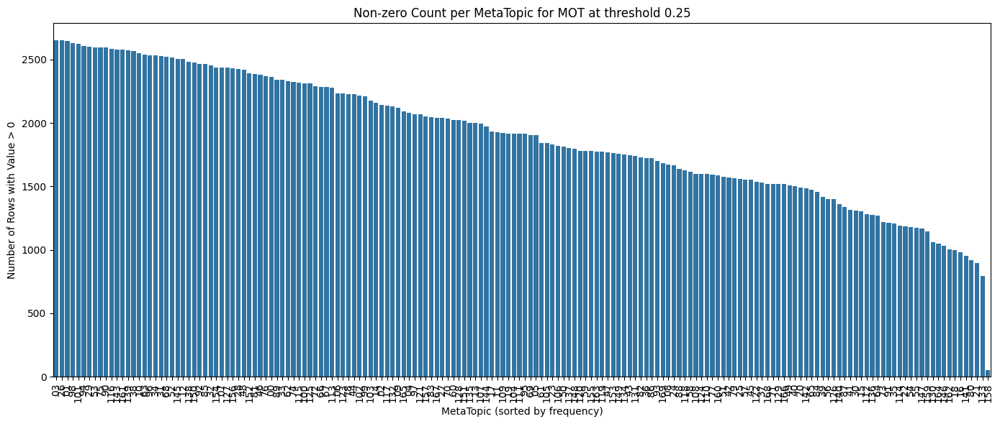

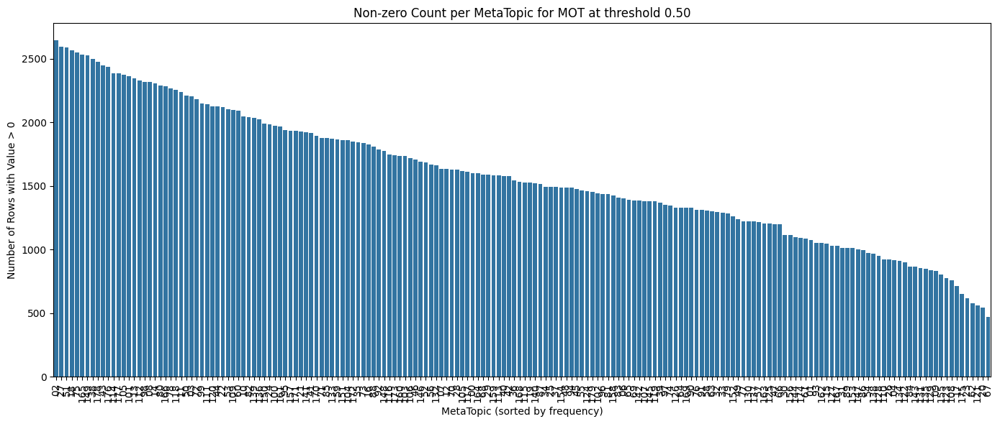

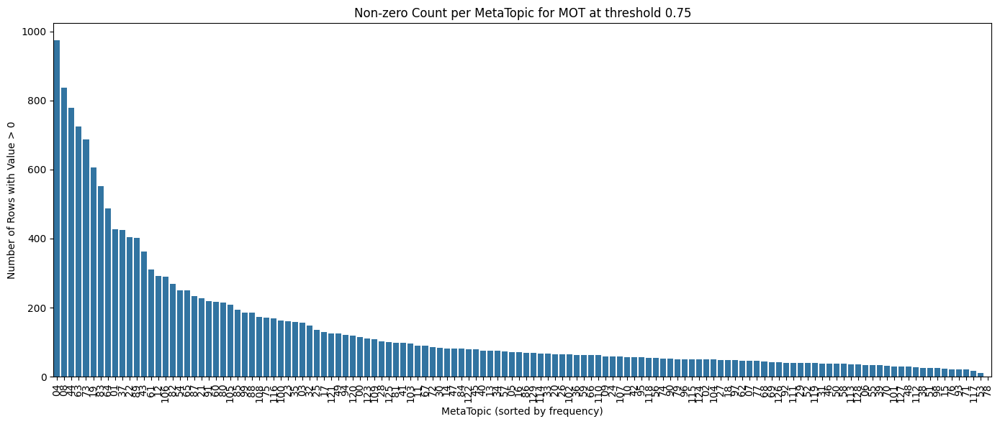

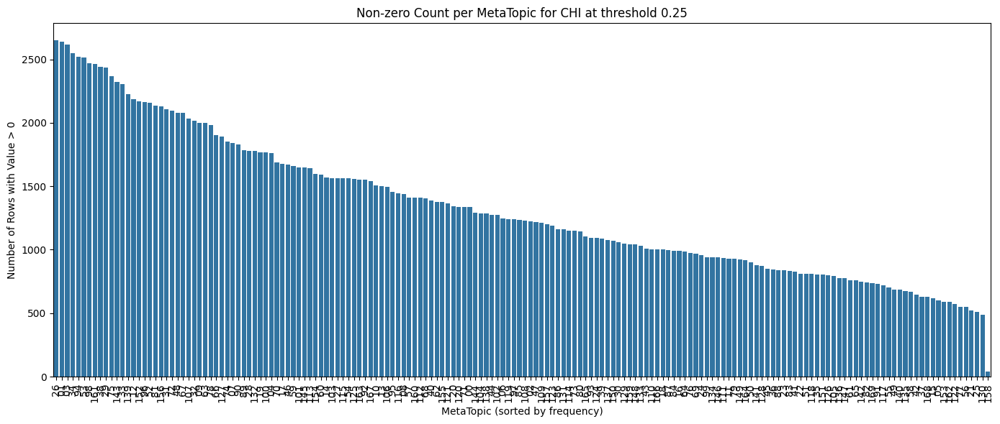

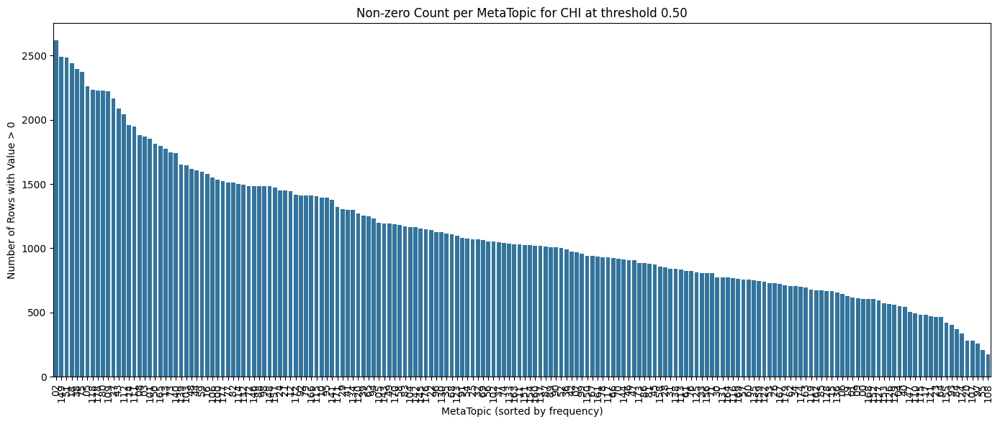

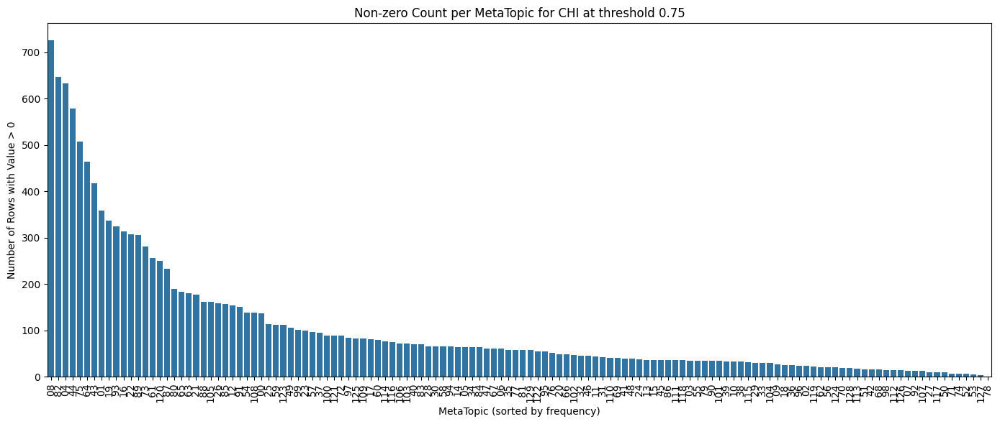

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2_Word_Utt.xlsx"
df = pd.read_excel(file_path)

thresholds = ['0.25', '0.50', '0.75']
speakers = ['MOT', 'CHI']

for speaker in speakers:
    for threshold in thresholds:
        cols = [col for col in df.columns if re.fullmatch(f"Word_{speaker}_MetaTopic_\\d+_t{threshold}", col)]
        
        topic_counts = []
        topic_labels = []

        for col in cols:
            count = (df[col] > 0).sum()
            topic_num = re.search(r'MetaTopic_(\d+)_t', col).group(1)
            topic_labels.append(topic_num)
            topic_counts.append(count)

        sorted_pairs = sorted(zip(topic_labels, topic_counts), key=lambda x: x[1], reverse=True)
        sorted_labels, sorted_counts = zip(*sorted_pairs)

        plt.figure(figsize=(14, 6))
        sns.barplot(x=list(sorted_labels), y=list(sorted_counts))
        plt.xticks(rotation=90)
        plt.title(f"Non-zero Count per MetaTopic for {speaker} at threshold {threshold}")
        plt.xlabel("MetaTopic (sorted by frequency)")
        plt.ylabel("Number of Rows with Value > 0")
        plt.tight_layout()
        plt.show()


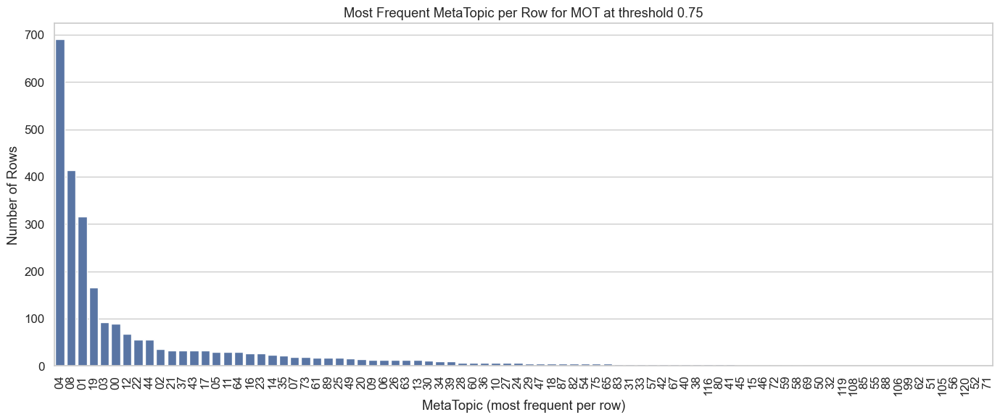

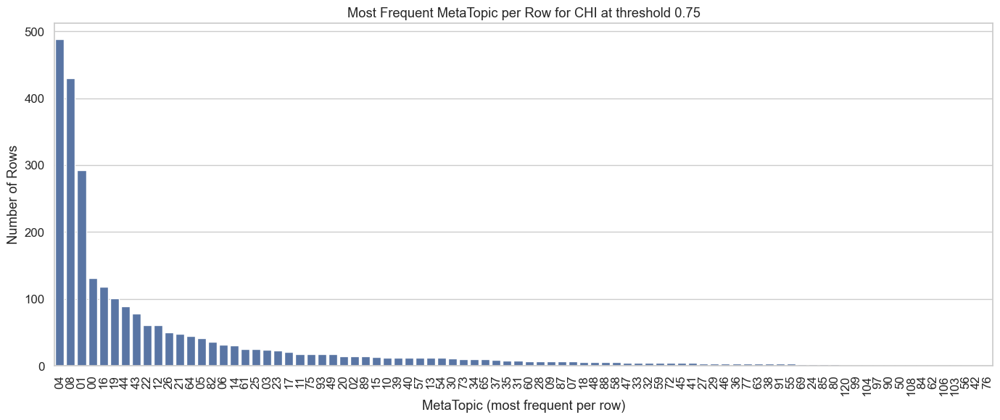

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

file_path = r"C:\Users\isa97\OneDrive\Documents\Uni Amsterdam\Linguistics\Thesis\Data\childes_data_filtered_2_Word_Utt.xlsx"
df = pd.read_excel(file_path)

threshold = '0.75'
speakers = ['MOT', 'CHI']

for speaker in speakers:
    cols = [col for col in df.columns if re.fullmatch(f"Word_{speaker}_MetaTopic_\\d+_t{threshold}", col)]

    if not cols:
        print(f"No columns found for {speaker} at threshold {threshold}")
        continue

    topic_df = df[cols]

    max_topic_per_row = topic_df.idxmax(axis=1)

    topic_labels = max_topic_per_row.str.extract(r'MetaTopic_(\d+)_t')[0]

    topic_counts = topic_labels.value_counts().sort_values(ascending=False)

    plt.figure(figsize=(14, 6))
    sns.barplot(x=topic_counts.index, y=topic_counts.values)
    plt.xticks(rotation=90)
    plt.title(f"Most Frequent MetaTopic per Row for {speaker} at threshold {threshold}")
    plt.xlabel("MetaTopic (most frequent per row)")
    plt.ylabel("Number of Rows")
    plt.tight_layout()
    plt.show()
